### **Итоговое задание Альмиры и Соколова Александра**  
### по Проекту 6. Car Price prediction 
####  Юнит 6. Основные алгоритмы машинного обучения. Часть II (отредактирован 9.9.2020)
---

### 1. Импорт библиотек

In [568]:
import pandas as pd
import pandas_profiling
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import re
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor
from sklearn.tree import ExtraTreeRegressor
from tqdm import tqdm
from itertools import combinations
from scipy.stats import ttest_ind

# потом удалить
# import seaborn as sns
#

# from math import log as log
# from sklearn.model_selection import train_test_split 
 
# from sklearn import metrics
# from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
# from sklearn.preprocessing import PolynomialFeatures
# from collections import Counter
# import datetime


# import seaborn as sns 



# import copy
# from IPython.display import display
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import confusion_matrix
# from sklearn.metrics import auc, roc_auc_score, roc_curve
# from sklearn.model_selection import StratifiedShuffleSplit
# from sklearn.feature_selection import f_classif, mutual_info_classif
# from sklearn.model_selection import GridSearchCV
# from sklearn.model_selection import cross_val_score
# from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS

from importlib import reload

import os
print(os.listdir('./data'))
PATH_to_file = './data/'

['all_auto_ru_09_09_2020.csv', 'df3_cols.csv', 'sample_submission.csv', 'test.csv']


In [569]:
import utils_module09092020 as utils

In [570]:
RANDOM_SEED = 42
!pip freeze > requirements.txt
CURRENT_DATE = pd.to_datetime('09/09/2020')

### 2. Импорт данных

In [571]:
df_train = pd.read_csv(PATH_to_file+'all_auto_ru_09_09_2020.csv')
df_test = pd.read_csv(PATH_to_file+'test.csv')
df_submit = pd.read_csv(PATH_to_file+'sample_submission.csv')
pd.set_option('display.max_columns', None)
print('Размерность тренировочного датасета: ', df_train.shape)
display(df_train.head(2))
print('Размерность тестового датасета: ', df_test.shape)
display(df_test.head(2))
print('Размерность датасета c примером сабмишена: ', df_submit.shape)
display(df_submit.head(2))

Размерность тренировочного датасета:  (89378, 26)


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,mileage,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,price,start_date,hidden,model
0,Седан,AUDI,040001,бензин,1990.0,2.8 MT (174 л.с.) 4WD,4.0,1991,SEDAN MECHANICAL 2.8,MECHANICAL,2.8,174.0,"Машина в приличном состоянии ,не гнилая не р...",350000,{'id': '0'},полный,LEFT,NaN,3.0,ORIGINAL,True,NaN,200000.0,2019-10-03T08:09:11Z,NaN,100
1,Седан,AUDI,EE1D19,бензин,1982.0,1.8 MT (90 л.с.),4.0,1986,SEDAN MECHANICAL 1.8,MECHANICAL,1.8,90.0,Машина в оригинале не гнилая все вопросы по те...,173424,{'id': '0'},передний,LEFT,NaN,3.0,ORIGINAL,True,NaN,60000.0,2020-09-06T06:49:40Z,NaN,100


Размерность тестового датасета:  (3837, 23)


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,mileage,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,id
0,седан,BMW,чёрный,дизель,2016.0,520d 2.0d AT (190 л.с.),4.0,2017.0,SEDAN AUTOMATIC 2.0,автоматическая,2.0 LTR,190 N12,В РОЛЬФ Ясенево представлено более 500 автомоб...,158836.0,"['[{""name"":""Безопасность"",""values"":[""Антипробу...",задний,Левый,Не требует ремонта,1 владелец,Оригинал,Растаможен,NaN,0
1,седан,BMW,белый,дизель,2018.0,318d 2.0d AT (150 л.с.),4.0,2019.0,SEDAN AUTOMATIC 2.0,автоматическая,2.0 LTR,150 N12,Автомобиль из демонстрационного парка по спец ...,10.0,"['[{""name"":""Комфорт"",""values"":[""Круиз-контроль...",задний,Левый,Не требует ремонта,1 владелец,Оригинал,Растаможен,NaN,1


Размерность датасета c примером сабмишена:  (3837, 2)


,id,price
0,0,5299000.0
1,1,1580000.0


### 2. Проверка и доработка датасета после парсинга для слияния с тестом

In [572]:
# сравним датасеты 
utils.check_df_before_merg(df_train, df_test)

,# уник_1,в первой строке_1,тип_1,имя признака_1,имя признака_2,тип_2,в первой строке_2,# уник_2
0,168.0,Седан,object,bodyType,bodyType,object,седан,11.0
1,36.0,AUDI,object,brand,brand,object,BMW,1.0
2,16.0,040001,object,color,color,object,чёрный,15.0
3,6.0,бензин,object,fuelType,fuelType,object,дизель,4.0
4,78.0,1990,float64,modelDate,modelDate,float64,2016,31.0
5,4484.0,2.8 MT (174 л.с.) 4WD,object,name,name,object,520d 2.0d AT (190 л.с.),384.0
6,5.0,4,float64,numberOfDoors,numberOfDoors,float64,4,4.0
7,80.0,1991,int64,productionDate,productionDate,float64,2017,37.0
8,1860.0,SEDAN MECHANICAL 2.8,object,vehicleConfiguration,vehicleConfiguration,object,SEDAN AUTOMATIC 2.0,99.0
9,4.0,MECHANICAL,object,vehicleTransmission,vehicleTransmission,object,автоматическая,3.0


Резюме:
 1. Не совпали типы в:= 11 столбцах

2. Уникальные значения заоблачно различаются в:= 10 столбцах [0, 1, 4, 5, 7, 8, 10, 11, 12, 13]


,имя признака_1,не совпадают типы,имя признака_2
index,,,
7,productionDate,int64!=float64,productionDate
11,enginePower,float64!=object,enginePower
13,mileage,int64!=float64,mileage
17,Состояние,float64!=object,Состояние
18,Владельцы,float64!=object,Владельцы
20,Таможня,bool!=object,Таможня
22,price,float64!=nan,NaN
23,start_date,object!=nan,NaN
24,hidden,float64!=nan,NaN


In [573]:
# починим датасет перед использованием и приведем его к виду теста

# на первый взгляд может, что перевод во float достаточно бесмыссленный шаг ведь кол-во дверей автомобиля это целое число. Но напомню что мы сейчас на этапе приведения датасета после парсинга к виду тестового. На этапе анализа датасета мы сможем более детально посмотреть что происходит в тестовом датасете (вероятно там есть ошибки которые надо исправить и мы можем потерять эту информацию не знаю сколько ошибок и какие они) 

# начнем с int64!=float64 и приведем все к float 
list_cols_to_repair = ['productionDate', 'mileage']
for col in list_cols_to_repair:
        df_train[col] = df_train[col].astype('float64')

# теперь починим int64!=float64 и приведем все к object
list_cols_to_repair = ['enginePower', 'Состояние', 'Владельцы']
for col in list_cols_to_repair:
        df_train[col] = df_train[col].astype('object')

# теперь починим bool!=object
# предварительно райдем в датасет и убедимся, что True соответсвует Растаможен зайдя на сайте (этот код тут не приводится, чтобы не нагружать ноутбук)
df_train['Таможня'] = df_train['Таможня'].map({True: 'Растаможен', False:'Не растаможен'})

In [574]:
utils.check_df_before_merg(df_train, df_test)

,# уник_1,в первой строке_1,тип_1,имя признака_1,имя признака_2,тип_2,в первой строке_2,# уник_2
0,168.0,Седан,object,bodyType,bodyType,object,седан,11.0
1,36.0,AUDI,object,brand,brand,object,BMW,1.0
2,16.0,040001,object,color,color,object,чёрный,15.0
3,6.0,бензин,object,fuelType,fuelType,object,дизель,4.0
4,78.0,1990,float64,modelDate,modelDate,float64,2016,31.0
5,4484.0,2.8 MT (174 л.с.) 4WD,object,name,name,object,520d 2.0d AT (190 л.с.),384.0
6,5.0,4,float64,numberOfDoors,numberOfDoors,float64,4,4.0
7,80.0,1991,float64,productionDate,productionDate,float64,2017,37.0
8,1860.0,SEDAN MECHANICAL 2.8,object,vehicleConfiguration,vehicleConfiguration,object,SEDAN AUTOMATIC 2.0,99.0
9,4.0,MECHANICAL,object,vehicleTransmission,vehicleTransmission,object,автоматическая,3.0


Резюме:
 1. Не совпали типы в:= 5 столбцах

2. Уникальные значения заоблачно различаются в:= 10 столбцах [0, 1, 4, 5, 7, 8, 10, 11, 12, 13]


,имя признака_1,не совпадают типы,имя признака_2
index,,,
22,price,float64!=nan,NaN
23,start_date,object!=nan,NaN
24,hidden,float64!=nan,NaN
25,model,object!=nan,NaN
26,NaN,nan!=int64,id


Резюме - несоответствие типов осталось в 5 столбцах \[price, start_date, hidden, model, id\], в том числе price - целевая переменная которую мы будем моделировать, три столбца чтобы попробовать обогатить данные, и столбцец id, который нам будет нужен для формирования файла submition.  
Теперь обратим внимание на значения и приведем их к общему виду 

In [575]:
# bodyType - надо привести значения к нижнему регистру (оставим закадром, проверку уникальных значений трейна и теста, чтобы прийти к такому выводу)
df_train['bodyType'] = df_train['bodyType'].apply(lambda x: str(x).lower())
utils.nunique_not_found(df_train, df_test, 'bodyType')


# color - цвета спарсились в шестнадцатеричном коде цветов. Но их всего 16 поэтому воспользуемся сайтом (https://hysy.org/color) и сделаем словарь цветов. (оставим закадром, проверку уникальных значений трейна и теста, чтобы сделать соответсвия цветов) 
dict_color = {'040001':'чёрный', 'EE1D19':'красный', '0000CC':'синий', 
              'CACECB':'серебристый', '007F00':'зелёный', 'FAFBFB':'белый', 
              '97948F':'серый', '22A0F8':'голубой', '660099':'пурпурный', 
              '200204':'коричневый', 'C49648':'бежевый', 'DEA522':'золотистый', 
              '4A2197':'фиолетовый', 'FFD600':'жёлтый', 'FF8649':'оранжевый', 
              'FFC0CB':'розовый'}
df_train['color'] = df_train['color'].map(dict_color)
utils.nunique_not_found(df_train, df_test, 'color')

# Руль - ну тут все просто - Правый или Левый в нижнем регистре с большой буквы
df_train['Руль'] = df_train['Руль'].map({'RIGHT':'Правый', 'LEFT':'Левый'})
utils.nunique_not_found(df_train, df_test, 'Руль')

# ПТС - тут все просто - Оригинал или Дубликат в нижнем регистре с большой буквы
df_train['ПТС'] = df_train['ПТС'].map({'ORIGINAL':'Оригинал', 'DUPLICATE':'Дубликат'})
utils.nunique_not_found(df_train, df_test, 'ПТС')

# Владельцы - Оригинал или Дубликат в нижнем регистре с большой буквы
df_train['Владельцы'] = df_train['Владельцы'].map({3.0:'3 или более', 2.0:'2\xa0владельца', 1.0:'1\xa0владелец'})
utils.nunique_not_found(df_train, df_test, 'Владельцы')

# Владение - в таблице сверху в первых строках Nan поэтому нужно отдельно проверить
# оказалось что в тесте очень сложная строковая запись тогда как в трейне в значениях более структурируемые словари (УчТЕМ этот момент и разберем этот столбец на этапе анализа, вероятно будет сразу полезно создать дополнительные временные фичи) 
utils.nunique_not_found(df_train, df_test, 'Владение');

в столбце:= bodyType в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= color в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= Руль в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= ПТС в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= Владельцы в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= Владение в трейне НЕ НАЙДЕНО:= 157 уникальных значений из теста


Резюме - несоответсвие значений в одинаковых типах осталось только в одном столбце - Владение, но приведение к единому виду целеообразно оставить до детально анализа по переменным, так как там зашиты данные о годе и месяце владения и в процессе обработке может быть сразу целесообразно будет создавать новые временные фичи.  

### 3. Слияние датасетов в один

In [576]:
# ВАЖНО! для корректной обработки признаков объединяем трейн и тест в один датасет
df_train['Train'] = 1 # помечаем где у нас трейн
df_test['Train'] = 0 # помечаем где у нас тест

df = df_train.append(df_test, sort=False).reset_index(drop=True) # объединяем
#!Обратите внимание объединение датасетов является потенциальной опасностью для даталиков

In [577]:
# провека  после слияния
df.head(2)

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,mileage,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,price,start_date,hidden,model,Train,id
0,седан,AUDI,чёрный,бензин,1990.0,2.8 MT (174 л.с.) 4WD,4.0,1991.0,SEDAN MECHANICAL 2.8,MECHANICAL,2.8,174,"Машина в приличном состоянии ,не гнилая не р...",350000.0,{'id': '0'},полный,Левый,NaN,3 или более,Оригинал,Растаможен,NaN,200000.0,2019-10-03T08:09:11Z,NaN,100,1,NaN
1,седан,AUDI,красный,бензин,1982.0,1.8 MT (90 л.с.),4.0,1986.0,SEDAN MECHANICAL 1.8,MECHANICAL,1.8,90,Машина в оригинале не гнилая все вопросы по те...,173424.0,{'id': '0'},передний,Левый,NaN,3 или более,Оригинал,Растаможен,NaN,60000.0,2020-09-06T06:49:40Z,NaN,100,1,NaN


### 4. Предварительный анализ данных

In [578]:
# анализ тренировочной части
pandas_profiling.ProfileReport(df[df['Train']==1])

In [579]:
# анализ валидационной части
pandas_profiling.ProfileReport(df[df['Train']==0])

In [580]:
# выведем сводную информацию по датасету df без теста kaggle
utils.describe_without_plots_all_collumns(df[df['Train']==1], short=True)

,имя признака,тип,# значений,# пропусков(NaN),# уникальных,минимум,среднее,макс,медиана
0,bodyType,object,89378,0,168,NaN,NaN,NaN,NaN
1,brand,object,89378,0,36,NaN,NaN,NaN,NaN
2,color,object,89378,0,16,NaN,NaN,NaN,NaN
3,fuelType,object,89378,0,6,NaN,NaN,NaN,NaN
4,modelDate,float64,89377,1,78,1904,2008.54,2020,2009
5,name,object,89377,1,4484,NaN,NaN,NaN,NaN
6,numberOfDoors,float64,89377,1,5,0,4.51047,5,5
7,productionDate,float64,89378,0,80,1904,2010.83,2020,2011
8,vehicleConfiguration,object,89377,1,1860,NaN,NaN,NaN,NaN
9,vehicleTransmission,object,89377,1,4,NaN,NaN,NaN,NaN


In [581]:
# выведем сводную информацию по тесту
utils.describe_without_plots_all_collumns(df[df['Train']==0], short=True)

,имя признака,тип,# значений,# пропусков(NaN),# уникальных,минимум,среднее,макс,медиана
0,bodyType,object,3837,0,11,NaN,NaN,NaN,NaN
1,brand,object,3837,0,1,NaN,NaN,NaN,NaN
2,color,object,3837,0,15,NaN,NaN,NaN,NaN
3,fuelType,object,3837,0,4,NaN,NaN,NaN,NaN
4,modelDate,float64,3837,0,31,1975,2009.95,2019,2011
5,name,object,3837,0,384,NaN,NaN,NaN,NaN
6,numberOfDoors,float64,3837,0,4,2,4.37503,5,5
7,productionDate,float64,3837,0,37,1981,2011.93,2019,2013
8,vehicleConfiguration,object,3837,0,99,NaN,NaN,NaN,NaN
9,vehicleTransmission,object,3837,0,3,NaN,NaN,NaN,NaN


Резюме по предварительному анализу: (выводы идут по порядку выявления, а не по значимости)  
В тренировочной выборке 88968 строк, в тестовой 3837. Всего данных - 93215 строк. Всего 28 признаков, из них:
- 23 в тесте: 
  - 4 - числовых - mileage, modelDate, productionDate (один из них id - сервисный для генерации submition), 
  - 19 - категориальных (пока так, во время анализа, вероятно, какие-нибудь из них станут числовыми, например можность двигателя)
- 4 были добавлены во время парсинга: 1- числовой - price, 1 - временной ряд - start_date, 1 - бинарный - hidden, 1 - категориальный - model
- 1 - бинарный Train  - сервисный для разделения train и test
  
Детальная информация по трейну и тесту раздельно:  
- признак Таможня бесполезен так как содержит одно значение - Растаможен => удалим
- в трейне 2114 (2.4%) дубликатов по строкам => надо удалить
- высокая корреляция между modelDate и productionDate => надо еще внимательно посмотреть на этапе анализа перед тем как удалить
- пропуски в трейне:
  - description - 3254 (3.6%) => надо заполнить
  - Состояние - 89378 (100.0%) - мы не смогли во время парсинга раздобыть этот критерий => надо проанализировать заполненность этого признака в тесте и постараться заполнить по похожим критериям авто требующих ремонта - так как это влияет на цену 
  - Владельцы - 13588 (15.2%) => надо заполнить 
  - Владение - 60177 (67.3%) => очень много пропусков надо попробовать заполнить
  - hidden - 89378 (100.0%) => надо удалить
  - id - 89378 (100.0%) - это столбец для генерации файла submition => ничего не делаем
- пропуски в тесте:
  - Владение - 2084 (54.3%) => надо заполнить
  - price, start_date, hidden, model - 3837 (100.0%) - дополнительные фичи => надо проанализировать и использовать для генерации новых фич или удалить
- между vehicleConfiguration и еще тремя признаками: vehicleTransmission, engineDisplacement, numberOfDoors - высокая корреляция => надо проверить это при анализе и при необходимости удалить
- в тесте:
  - brand - только одно значение - "BMW" => надо дополнительно собрать информацию с обзоров цен на BMW и постараться оставить для анализа автомобили со схожими характеристиками, которые влюяют на цену
  - Руль - только одно значение - "Левый" => надо взять из трейна только авто с Левым рулем
  - Состояние - только одно значение - "Не требует ремонта" => надо обратить внимание на выбросы снизу по цене из трейна, чтобы не брать в учет авто требующие ремонта

Описания полей датасета
- bodyType - тип кузова автомобиля (https://ru.wikipedia.org/wiki/Типы_автомобильных_кузовов)
- brand
- color	object
- fuelType
- modelDate
- name
- numberOfDoors
- productionDate
- vehicleConfiguration
- vehicleTransmission
- engineDisplacement
- enginePower - мощность двигателя (л.с.)
- description
- mileage - пробег автомобиля (км.) - представляет собой общее количество километров, которое это транспортное средство проехало по дорогам с момента своего схода с конвейера производителя. 
- Комплектация
- Привод - характеристика привода автомобиля, которое передает энергию от двигателя на колеса. Переднеприводные автомобили получают всю энергию двигателя на передние колеса. При заднем приводе энергия двигателя целиком поступает на задние колеса. Когда энергия двигателя передается на все четыре колеса автомобиля, такой привод является полным ('полный', 'передний', 'задний')
- Руль - характеристика руля по стороне расположения руля в автомобиле (Левый, Правый)
- Состояние
- Владельцы
- ПТС
- Таможня
- Владение
- price - цена указанная в объявлении на авто.ру
- start_date - дата размещения объявления на авто.ру
- hidden - характеристика объявления на авто.ру
- model - название модели автомобиля (не путать с маркой (брендом), например: бренд или марка - BMW, модель - M6)
- Train - сервисный для разделения train и test
- id - - сервисный для генерации submition

In [582]:
# внесем данные по типам переменных из резюме в списки 
# временной ряд (1)
time_cols = ['start_date']
# бинарная переменная (0) (hidden - не включаем так как решили удалить) итого  (0+1=1)
bin_cols = []
# категориальные переменные (19), ('Таможня' - не включаем  так как решили удалить) (19+1=20)
cat_cols = ['bodyType', 'brand', 'color', 'fuelType', 'name',
       'numberOfDoors', 'vehicleConfiguration',
       'vehicleTransmission', 'engineDisplacement', 'enginePower',
       'description', 'Комплектация', 'Привод', 'Руль', 'Состояние',
       'Владельцы', 'ПТС', 'Владение', 'model']
# числовые переменные (3) 
num_cols = ['mileage', 'modelDate', 'productionDate']
# сервисные переменные (2)
servis_cols = ['Train', 'id']
# целевая переменная (1)
target_col = ['price']
# итого 1+1+20+3+2+1=28

all_cols =cat_cols+num_cols+time_cols+servis_cols+bin_cols+ target_col
print(f'Кол-во столбцов, для дальнейшей работы после предварительного анализа:= {len(all_cols)}')

Кол-во столбцов, для дальнейшей работы после предварительного анализа:= 26


In [583]:
# реализуем выводы из резюме перед детальным анализом по переменным
# берем только левый руль и тольк 26 столбцов
df = df.loc[df['Руль'] == 'Левый', all_cols]
# исключаем Руль из списка признаков для анализа итого остается 25 признаков из которых 2 сервисных (нужно проанализировать 23=25-2)
cat_cols.remove('Руль')
# удаляем дубликаты
df = df.drop_duplicates()
old_len_train = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', old_len_train)

Кол-во строк в трейне:=  85481


### 5. Сбор дополнительной информации о BMW
---
Какие то важные факты для дальнейшего анализа с дополнениями и выводами:
- статистика по ценам обычно приводится по моделям, а в тесте признака модель нет => надо попробовать его восстановить
- существует общепринятое деление по классам - \[малый средний класс, средний класс, бизнес класс, представительский класс, внедорожники, купе, кабриолеты и родстеры\] => надо проверить возможно такая группировка позволит найти какие-то закономерности внутри классов
- обычно эта марка не включается в какие-то программы поддержки продаж для диллеров (типа сниженный процент от государства и т.п.)
- в России автомобили BMW собираются в Калининграде («Автотор») (3 серия, 5 серия, 7 серия, X3, X5, X1, X6) => соотвественно нет необходимости расстамаживать эти марки автомобилей
- увеличенный на 22 мм клиренс, более жёсткие амортизаторы и усиленные стабилизаторы, адаптированная под морозы электроника, сборка менее чувствительна к качеству бензина - это основные отличия русской сборки => вероятно диллеры учитывают ньансы для продажи авто в России, надо обратить внимание что входит в комплектацию, возможно есть вещи, которые существенно увеличивают стоимость
- ранее 3-4 летние авто сильно теряли в цене, теперь этот порог сдвинулся до 5-6 лет => вероятно это из-за расширения сроков гарантии на авто, когда подходят гарантия или пониженный по стоимости и более долгий техосмотр, владельцы продают автомобили
- на рынке этой марки в отличии от других присутсвует некоторая философия БМВ - в новом авто предположительно очень большая доля так называемых транзакционных издержек (оверхедов) + стоимость бренда, которые после покупки авто первым владельцем "сильно" снижаются, дальше для рынка остается себестоимость машины. Эта себестоимость торгуется на рынке, но BMW находит своих приверженцев, которые также платят чуть дороже, но за BMW, за свой стиль жизни, комфорт, за свою философию BMW => надо проверить действительно ли это так, сделать несколько срезов по маркам и моделям и оставить для анализа либо только БМВ либо авто, которые попадают в конкурентные с БМВ ниши.  

Использованы материалы с ресурсов:
- https://auto.ru/stats/cars/bmw/
- https://ru.wikipedia.org/wiki/BMW
- https://zen.yandex.ru/media/id/5987885f1410c361e4ba0f9c/bmv-nemeckoi-sborki-v-chem-otlichie-ot-kaliningradskih-mashin-5d4da573ec575b00ad872a7a  
и другие

### 6. Детальный анализ по переменным
---
### 6.1 bodyType 
начнем с типа кузова bodyType, чтобы убедиться в том что значения по всем маркам и моделям примерно одинаковые или наоборот и тогда убрать нерелевантные типы кузова

In [584]:
# так как признаков много создаем список проанализированных признаков, чтобы можно было посмотреть, что осталось сделать  
EDA_done_cols=[]

In [585]:
temp_df_Train = df[df['Train']==1]
temp_df_Test = df[df['Train']==0]
print(f'Всего в тесте типов кузова:= {temp_df_Test.bodyType.nunique()}')
print(f'Всего в трейне типов кузова:= {temp_df_Train.bodyType.nunique()}')

Всего в тесте типов кузова:= 11
Всего в трейне типов кузова:= 144


In [586]:
# посмотрим на них 
print(f'Список 11 типов кузова БМВ из теста:= {temp_df_Test.bodyType.unique()}')
print(f'Список первых 20 из 144 типов кузова из трейна:= {temp_df_Train.bodyType.unique()[:20]}')

Список 11 типов кузова БМВ из теста:= ['седан' 'внедорожник 5 дв.' 'хэтчбек 3 дв.' 'хэтчбек 5 дв.' 'купе'
 'родстер' 'лифтбек' 'универсал 5 дв.' 'кабриолет' 'седан 2 дв.'
 'компактвэн']
Список первых 20 из 144 типов кузова из трейна:= ['седан' 'универсал 5 дв.' 'хэтчбек 5 дв. sportback' 'хэтчбек 3 дв.'
 'хэтчбек 5 дв.' 'кабриолет' 'купе' 'лифтбек sportback' 'лифтбек'
 'седан long' 'внедорожник 5 дв.' 'кабриолет roadster' 'седан 2 дв.'
 'седан gran coupe' 'компактвэн' 'компактвэн gran tourer'
 'лифтбек gran turismo' 'хэтчбек 3 дв. compact' 'лифтбек gran coupe'
 'купе-хардтоп']


In [587]:
# оставляем только типы кузова как в тесте
list_bodyType_test = list(temp_df_Test.bodyType.unique())
df = df[df['bodyType'].isin(list_bodyType_test)]

***Резюме по bodyType:-*** Категориальный признак, оставили 11 типов кузовов, так как типы кузовов отличающиеся от кузовов в тесте очень специфичны и очень сильно влияют на класс автомобиля по которому по общим закономерностям формируется цена, оставим только типы кузова из теста, а потом после EDA проверим достаточно ли большая выборка трейна остается для моделирования или необходимо парсить другие сайты. Пропусков нет.

In [588]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('bodyType')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось:= {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 1, осталось:= 22
Кол-во строк в трейне:=  79193 . Убрали на данном шаге:=  6288
Кол-во строк в тесте:=  3837


### 6.2 enginePower
забежим вперед и обработаем мощность двигателя потому что она нам потребуется для анализа марок

In [589]:
# вспомним что по результатам предварительного анализа эта переменная была отнесена к категориальнымu, посмотрим почему
temp_df_Train = df[df['Train']==1]
temp_df_Test = df[df['Train']==0]
display(temp_df_Train.enginePower[:5])
display(temp_df_Test.enginePower[:5])

0    174
1     90
2    136
3     90
4    101
Name: enginePower, dtype: object

89378    190 N12
89379    150 N12
89380    407 N12
89381    249 N12
89382    381 N12
Name: enginePower, dtype: object

In [590]:
# проверим все значения теста по мощности 
temp_df_Test.enginePower.unique()

array(['190 N12', '150 N12', '407 N12', '249 N12', '381 N12', '245 N12',
       '177 N12', '184 N12', '115 N12', '231 N12', '156 N12', '306 N12',
       '218 N12', '136 N12', '235 N12', '286 N12', '122 N12', '265 N12',
       '258 N12', '340 N12', '355 N12', '170 N12', '333 N12', '192 N12',
       '610 N12', '264 N12', '555 N12', '313 N12', '272 N12', '450 N12',
       '445 N12', '400 N12', '320 N12', '530 N12', '204 N12', '269 N12',
       '560 N12', '143 N12', '431 N12', '575 N12', '193 N12', '140 N12',
       '420 N12', '163 N12', '105 N12', '326 N12', '625 N12', '300 N12',
       '329 N12', '367 N12', '460 N12', '197 N12', '360 N12', '113 N12',
       '100 N12', '370 N12', '374 N12', '462 N12', '188 N12', '544 N12',
       '129 N12', '102 N12', '600 N12', '118 N12', '125 N12', '507 N12',
       '609 N12', '252 N12', '410 N12', '347 N12', '449 N12', '243 N12',
       '230 N12', '211 N12', '90 N12'], dtype=object)

In [591]:
# в тесте вытащим значение мощности перед строкой ' N12'
df.loc[df['Train']==0, 'enginePower'] = df[df['Train']==0]['enginePower'].apply(lambda x: int(x.split()[0]))

In [592]:
# переводим в int64
df['enginePower'] = df['enginePower'].astype('int64')

# перенесем признак в числовые
cat_cols.remove('enginePower')
num_cols.append('enginePower')

In [593]:
utils.describe_without_plots('enginePower', df[df['Train']==1].enginePower)

,enginePower
кол-во строк,79193
тип значений,int64
кол-во значений,79193
кол-во NaN,0
среднее,169.323
медиана,150
мин,11
макс,800


In [594]:
# очень странное минимальное значение можности, давайте посмотрим минимум мощности на тесте 
utils.describe_without_plots('enginePower', df[df['Train']==0].enginePower)

,enginePower
кол-во строк,3837
тип значений,int64
кол-во значений,3837
кол-во NaN,0
среднее,242.546
медиана,231
мин,90
макс,625


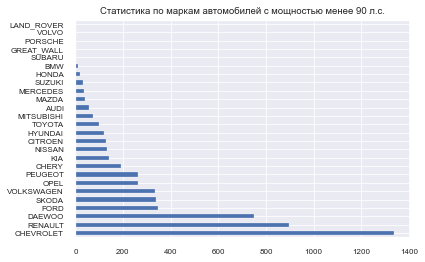

In [595]:
df[(df['Train']==1) & (df['enginePower']<90)]['brand'].value_counts().plot(kind = 'barh', title='Cтатистика по маркам автомобилей с мощностью менее 90 л.с.')

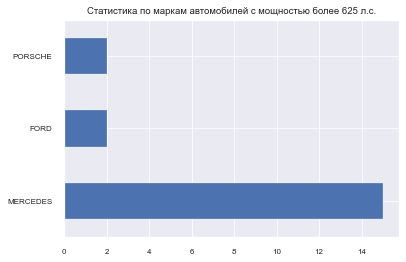

In [596]:
df[(df['Train']==1) & (df['enginePower']>625)]['brand'].value_counts().plot(kind = 'barh', title='Cтатистика по маркам автомобилей с мощностью более 625 л.с.')

In [597]:
# удалим значения мощностей меньше 90 и выше 625
df=df[(df['enginePower']<=625) & (df['enginePower']>=90)]

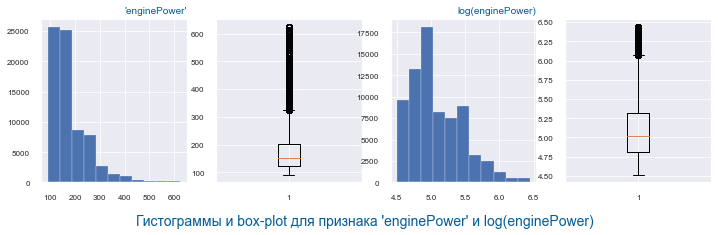

In [598]:
utils.four_plot_with_log2('enginePower', df[df['Train']==1])

***Резюме по enginePower:-*** обработали строки и перевели мощность в int64. Пропусков нет. Было какое-то небольшое значение мощности в трейне равное 11. Через это вышли на сравнение мощности с тестом и обрезали трейн по мощности двигателя то теста (более 90 и менее 625). О характере распределения и выбросах говорить пока рано, так как предстоит фильтрация по бренду, целесообразно вернуться к более детальному анализу после того как датасет устаканится. 

In [599]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('enginePower')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 2, осталось 21
Кол-во строк в трейне:=  73548 . Убрали на данном шаге:=  5645
Кол-во строк в тесте:=  3837


### 6.3 brand
теперь посмотрим на марки - brand

In [600]:
print(f'Всего в датасета марок:= {df.brand.nunique()}')

Всего в датасета марок:= 36


Вероятно не все из них нам подходят, сделаем сводные таблицы и посмотрим на средние значения цен по автомобилям по годам

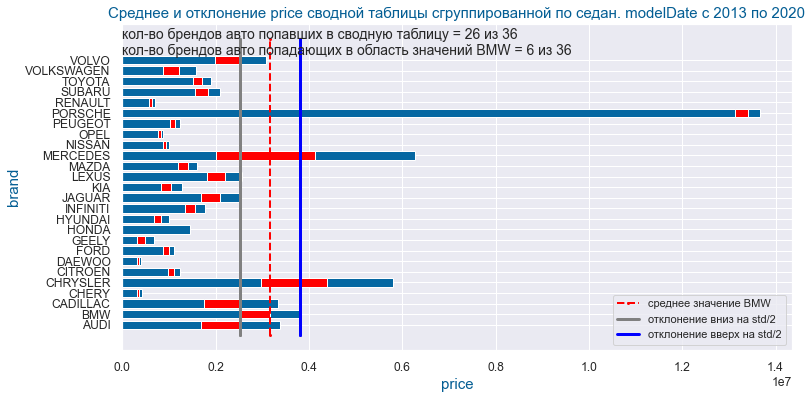

Список релевантных брендов:  AUDI CADILLAC CHRYSLER LEXUS MERCEDES VOLVO


In [601]:
list_brand0 = utils.hbar_group_pivot_table(list_bodyType_test[0], 'price', df[df['Train']==1], 2013, 2020, 1.1)

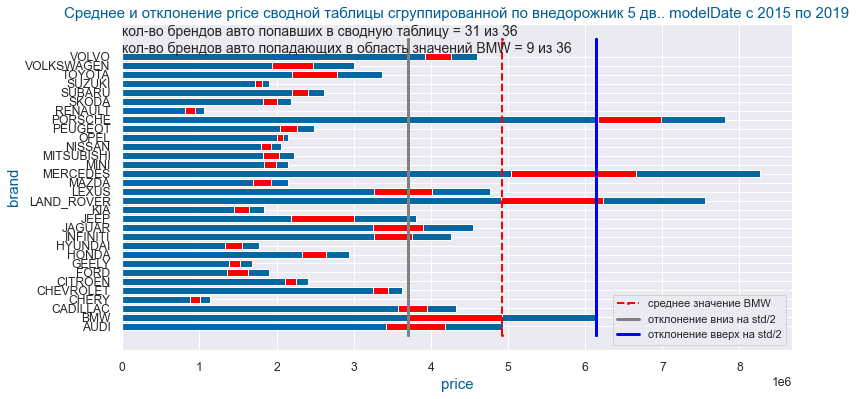

Список релевантных брендов:  AUDI CADILLAC INFINITI JAGUAR JEEP LAND_ROVER LEXUS MERCEDES VOLVO


In [602]:
list_brand1 = utils.hbar_group_pivot_table(list_bodyType_test[1], 'price', df[df['Train']==1], 2015, 2019, 1.1)

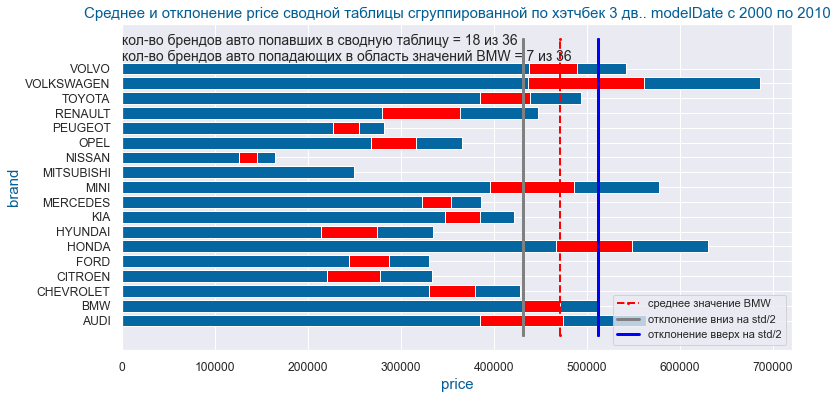

Список релевантных брендов:  AUDI HONDA MINI RENAULT TOYOTA VOLKSWAGEN VOLVO


In [603]:
list_brand2 = utils.hbar_group_pivot_table(list_bodyType_test[2], 'price', df[df['Train']==1], 2000, 2010, 1.1)

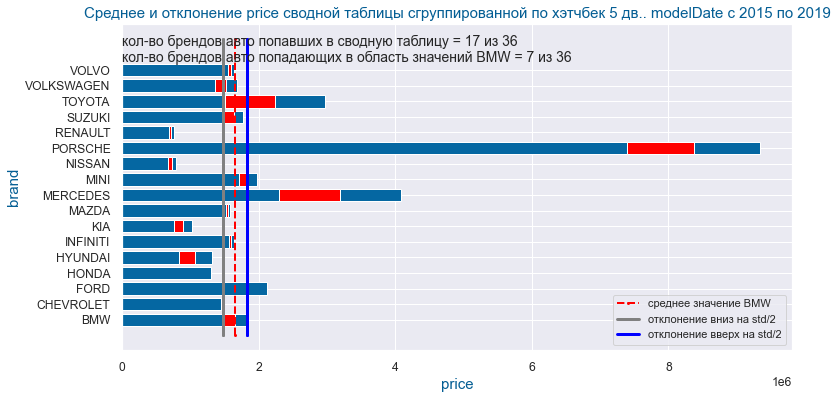

Список релевантных брендов:  INFINITI MAZDA MINI SUZUKI TOYOTA VOLKSWAGEN VOLVO


In [604]:
list_brand3 = utils.hbar_group_pivot_table(list_bodyType_test[3], 'price', df[df['Train']==1], 2015, 2019, 1.1)

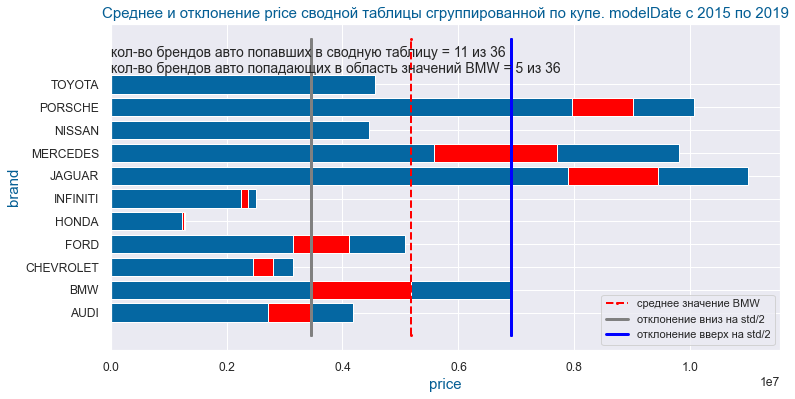

Список релевантных брендов:  AUDI FORD MERCEDES NISSAN TOYOTA


In [605]:
list_brand4 = utils.hbar_group_pivot_table(list_bodyType_test[4], 'price', df[df['Train']==1], 2015, 2019, 1.1)

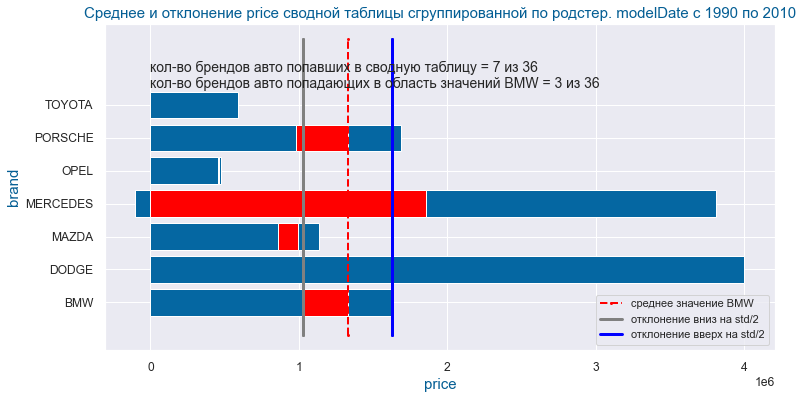

Список релевантных брендов:  MAZDA MERCEDES PORSCHE


In [606]:
list_brand5 = utils.hbar_group_pivot_table(list_bodyType_test[5], 'price', df[df['Train']==1], 1990, 2010, 1.1)

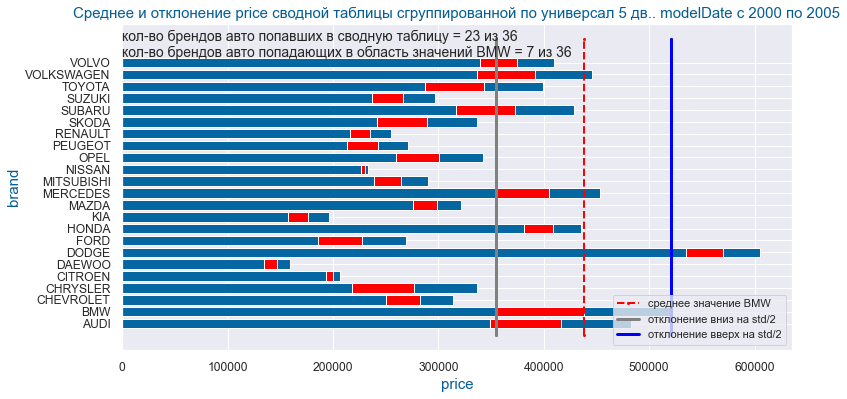

Список релевантных брендов:  AUDI HONDA MERCEDES SUBARU TOYOTA VOLKSWAGEN VOLVO


In [607]:
list_brand7 = utils.hbar_group_pivot_table(list_bodyType_test[7], 'price', df[df['Train']==1], 2000, 2005, 1.1)

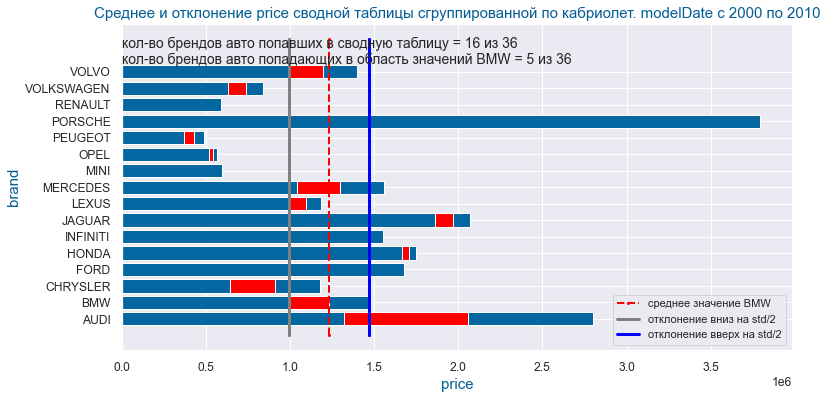

Список релевантных брендов:  AUDI CHRYSLER LEXUS MERCEDES VOLVO


In [608]:
list_brand8 = utils.hbar_group_pivot_table(list_bodyType_test[8], 'price', df[df['Train']==1], 2000, 2010, 1.1)

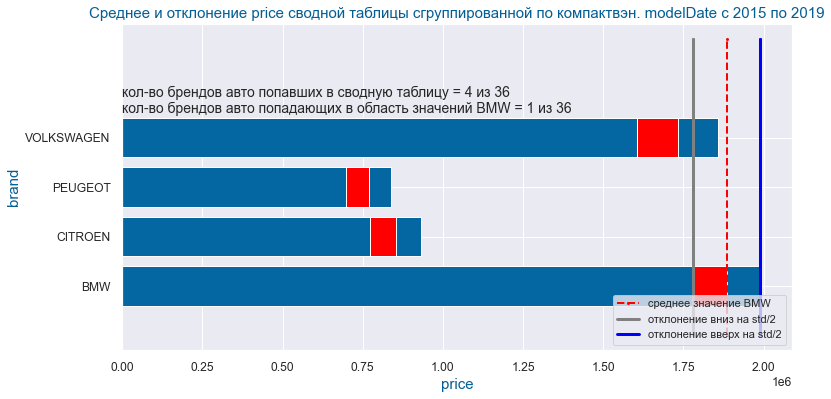

Список релевантных брендов:  VOLKSWAGEN


In [609]:
list_brand10 = utils.hbar_group_pivot_table(list_bodyType_test[10], 'price', df[df['Train']==1], 2015, 2019, 1.1)

In [610]:
# список всех релевантных моделей
list_final_brand=list(set(list_brand0+list_brand1+list_brand2+list_brand3+list_brand4+list_brand5+list_brand7+list_brand8+list_brand10))
print('Список релевантных брендов авто:\n',*list_final_brand, '\n, их кол-во:=', len(list_final_brand), 'из 36')
print()

Список релевантных брендов авто:
 LEXUS TOYOTA SUBARU JAGUAR CADILLAC MERCEDES VOLKSWAGEN NISSAN CHRYSLER PORSCHE AUDI MINI LAND_ROVER INFINITI RENAULT MAZDA VOLVO SUZUKI JEEP HONDA FORD 
, их кол-во:= 21 из 36



In [611]:
# кроме этого в трейне нет некоторых авто БМВ с типом кузова
print('В трейне не оказалось авто БМВ с типом кузова:=', list_bodyType_test[6])
temp_df_Train = df[df['Train']==1]
temp=list(temp_df_Train[temp_df_Train['bodyType']==list_bodyType_test[6]].brand.unique())
print('Список брендов авто с типом кузова', list_bodyType_test[6], ':=', *temp)

В трейне не оказалось авто БМВ с типом кузова:= лифтбек
Список брендов авто с типом кузова лифтбек := AUDI CHERY CITROEN FORD KIA MAZDA OPEL RENAULT SKODA TOYOTA VOLKSWAGEN MERCEDES


Резюме: Авто с типом кузова лифтбек содержат марки авто которые мы собираемся оставить так что все ок, не нужно ничего добавлять к списку сверху

In [612]:
# кроме этого в трейне нет некоторых авто БМВ с типом кузова
print('В трейне не оказалось авто БМВ с типом кузова:=', list_bodyType_test[9])
temp_df_Train = df[df['Train']==1]
temp=list(temp_df_Train[temp_df_Train['bodyType']==list_bodyType_test[9]].brand.unique())
print('Список брендов авто с типом кузова', list_bodyType_test[9], ':=', *temp)

В трейне не оказалось авто БМВ с типом кузова:= седан 2 дв.
Список брендов авто с типом кузова седан 2 дв. := BMW


In [613]:
temp_df_Train[temp_df_Train['bodyType']==list_bodyType_test[9]]

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,start_date,Train,id,price
4084,седан 2 дв.,BMW,оранжевый,бензин,2.0 MT (101 л.с.),2.0,SEDAN_2_DOORS MECHANICAL 2.0,MECHANICAL,2.0,101,В СССР прибыл новым. В семье с 1977 г. Один вл...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 1977, 'month': 12}",02,117000.0,1966.0,1972.0,2019-05-25T20:43:16Z,1,NaN,1000000.0
4902,седан 2 дв.,BMW,чёрный,бензин,318 1.8 MT (98 л.с.),2.0,SEDAN_2_DOORS MECHANICAL 318,MECHANICAL,318,98,"Автомобиль на ходу, брался под проект, стоит в...",{'id': '0'},задний,Левый,NaN,3 или более,Дубликат,"{'year': 2020, 'month': 6}",3ER,500000.0,1975.0,1978.0,2020-08-02T14:29:15Z,1,NaN,160000.0


У нас всего два таких авто БМВ с таким типов кузова, поэтому им не с кем было сравнится по цене

In [614]:
# оставляем 22 релевантных (21+BMW) бренд авто, остальные удаляем
df = df[df['brand'].isin(list_final_brand+['BMW'])]

***Резюме по brand*** - Проведен анализ средних и стандартных отклонений по ценам BMW по всем 11 типам кузова которые являются основным индикатором класса автомобиля. По результатам анализа выявлены 21 релевантные для моделирования цены бренды: AUDI CHERY CITROEN FORD KIA MAZDA OPEL RENAULT SKODA TOYOTA VOLKSWAGEN MERCEDES. Датасет урезан до этих брендов - осталось 22 вместе с BMW. Пропусков нет. 

In [615]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('brand')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 3, осталось 20
Кол-во строк в трейне:=  48715 . Убрали на данном шаге:=  24833
Кол-во строк в тесте:=  3837


### 6.4 fuelType

In [616]:
# вспомним что по результатам предварительного анализа в этой переменной было 6 уникальных значений в трейне и 4 в тесте
temp_df_Train = df[df['Train']==1]
temp_df_Test = df[df['Train']==0]
print(f'Список зачений по fuelType в трейне:= {list(temp_df_Train.fuelType.unique())}')
print(f'Список зачений по fuelType в тесте:= {list(temp_df_Test.fuelType.unique())}')

Список зачений по fuelType в трейне:= ['бензин', 'дизель', 'электро', 'гибрид', 'газ']
Список зачений по fuelType в тесте:= ['дизель', 'бензин', 'гибрид', 'электро']


In [617]:
# уберем газ так как автомобилей на газе нет в тесте
list_fuelType_test = temp_df_Test.fuelType.unique()
df = df[df['fuelType'].isin(list_fuelType_test)]

In [618]:
# Посмотрим сколько элекромобилей в тесте
print('Распределение по кол-ву зачений по fuelType в трейне:= \n',temp_df_Train.fuelType.value_counts())
print('Распределение по кол-ву зачений по fuelType в тесте:= \n',temp_df_Test.fuelType.value_counts())

Распределение по кол-ву зачений по fuelType в трейне:= 
 бензин     39906
дизель      8571
гибрид       160
электро       68
газ           10
Name: fuelType, dtype: int64
Распределение по кол-ву зачений по fuelType в тесте:= 
 бензин     2471
дизель     1358
гибрид        7
электро       1
Name: fuelType, dtype: int64


In [619]:
# посмотрим на автомобили БМВ в трейне и в тесте
temp_df = temp_df_Train[(temp_df_Train['fuelType']=='электро')&(temp_df_Train['brand']=='BMW')]
print(f'Кол-во электрокаров BMW в трейне:= {len(temp_df)}')
display(temp_df)

display(temp_df_Test[(temp_df_Test['fuelType']=='электро')&(temp_df_Test['brand']=='BMW')])

Кол-во электрокаров BMW в трейне:= 7


,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,start_date,Train,id,price
8256,хэтчбек 5 дв.,BMW,серебристый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,Производство 12 месяц 2014 года. В наличии! Ав...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,89942.0,2013.0,2014.0,2020-08-17T08:51:48Z,1,NaN,1430000.0
8257,хэтчбек 5 дв.,BMW,белый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,"Автомобиль в наличии Москве , с ПТС , производ...","{'id': '21624597', 'name': 'i3 120 Ah', 'avail...",задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,25000.0,2017.0,2018.0,2020-08-22T09:38:05Z,1,NaN,2319000.0
8261,хэтчбек 5 дв.,BMW,белый,электро,94Ah Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC 94Ah,AUTOMATIC,94Ah,170,"Автомобиль в наличии с ПТС , ГЛОНАС и ТД!!! Мо...",{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 2}",I3,41000.0,2013.0,2017.0,2020-07-21T18:32:26Z,1,NaN,2299000.0
8263,хэтчбек 5 дв.,BMW,серый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,Авто в наличии в Московской области с июня 202...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 5}",I3,45053.0,2013.0,2016.0,2020-06-27T09:53:48Z,1,NaN,1690000.0
8266,хэтчбек 5 дв.,BMW,серый,электро,94Ah Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC 94Ah,AUTOMATIC,94Ah,170,Состояние нового автомобиля . \nФото ИМЕННО ЭТ...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 2}",I3,20000.0,2013.0,2017.0,2020-07-10T17:13:21Z,1,NaN,2099000.0
8267,хэтчбек 5 дв.,BMW,чёрный,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,Автомобиль BMW i3 (полностью электрический )за...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,78000.0,2013.0,2016.0,2020-07-24T10:36:20Z,1,NaN,1899999.0
8269,хэтчбек 5 дв.,BMW,чёрный,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,"BMW i3 Электромобиль с бензиновым генератором,...",{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2017, 'month': 9}",I3,39500.0,2017.0,2017.0,2020-05-12T14:12:15Z,1,NaN,2385286.0


,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,start_date,Train,id,price
90201,хэтчбек 5 дв.,BMW,белый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC,автоматическая,undefined LTR,170,Комплектация с Rex(бензиновый генератор которы...,"['[{""name"":""Безопасность"",""values"":[""Антипробу...",задний,Левый,Не требует ремонта,1 владелец,Оригинал,NaN,NaN,52900.0,2013.0,2016.0,NaN,0,823.0,NaN


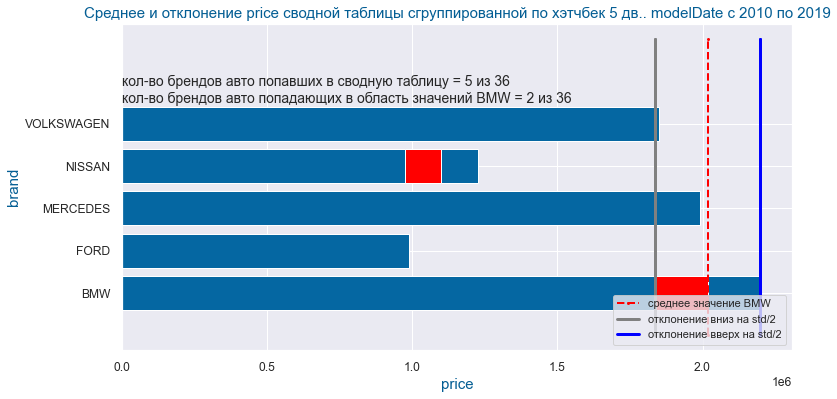

Список релевантных брендов:  MERCEDES VOLKSWAGEN


In [620]:
# посмотрим какие бренды в остальных (68-7=61) электрокаров трейна и как распределены по ним цены
temp_df = temp_df_Train[(temp_df_Train['fuelType']=='электро')] 
list_brand = utils.hbar_group_pivot_table(list_bodyType_test[3], 'price', temp_df, 2010, 2019, 1.1)

***Резюме по fuelType:-*** Категориальный признак. 4 значения ('газ' удалили). Электрокаров BMW в трейне - 7, в тесте - 1. Остальные 61 электрокар существенно ниже по цене, что может привести к снижению цены при моделировании БМВ. Кроме этого, визуальный осмотр значений электрокаров показал что стоит обратить внимание на обрабортку признака объем двигателя по этой группе. К сожалению нет фиксированной связи между можностью автомобиля и объемом двигателя, поэтому для моделирования важно сохранить оба признака, но по электрокарам нет значений и надо будет их как-то заполнить (может быть вывести из киловатов, но и они заполнены не везде)    

In [621]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('fuelType')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 4, осталось 19
Кол-во строк в трейне:=  48705 . Убрали на данном шаге:=  10
Кол-во строк в тесте:=  3837


### 6.5 engineDisplacement

In [622]:
# обработаем значения с помощью регулярных выражений найдя значения объема в литра типа 2.0 и переведем их см3 
def engineDisplacement_to_float(row):
    row = str(row)
    volume = re.findall('\d\.\d', row)
    if volume == []:
        return None
    return int(float(volume[0])*1000)
# поле engineDisplacement заполненно не полностью именно мощностью, в отличии от поля name
# поэтому вытаскиваем мощность из поля name
df['engineDisplacement2'] = df['name'].apply(engineDisplacement_to_float)

In [623]:
# посмотрим сколько пропусков
len(df[df['engineDisplacement2'].isna()])

67

In [624]:
# подозрительно знакомое число видимо это электрокары, проверим 
df[df['engineDisplacement2'].isna()].fuelType.unique()

array(['электро'], dtype=object)

In [625]:
# посмотрим что там внутри 
temp_df_Train = df[df['Train']==1]
temp_df = temp_df_Train[temp_df_Train['engineDisplacement2'].isna() & (temp_df_Train['brand']=='BMW')]
display(temp_df.head(2))
display(temp_df.describe())

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,start_date,Train,id,price,engineDisplacement2
8256,хэтчбек 5 дв.,BMW,серебристый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,Производство 12 месяц 2014 года. В наличии! Ав...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,89942.0,2013.0,2014.0,2020-08-17T08:51:48Z,1,NaN,1430000.0,NaN
8257,хэтчбек 5 дв.,BMW,белый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,"Автомобиль в наличии Москве , с ПТС , производ...","{'id': '21624597', 'name': 'i3 120 Ah', 'avail...",задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,25000.0,2017.0,2018.0,2020-08-22T09:38:05Z,1,NaN,2319000.0,NaN


,numberOfDoors,enginePower,mileage,modelDate,productionDate,Train,id,price,engineDisplacement2
count,7.0,7.0,7.000000,7.000000,7.000000,7.0,0.0,7.000000e+00,0.0
mean,5.0,170.0,48356.428571,2014.142857,2016.428571,1.0,NaN,2.017469e+06,NaN
std,0.0,0.0,26144.396735,1.951800,1.272418,0.0,NaN,3.601556e+05,NaN
min,5.0,170.0,20000.000000,2013.000000,2014.000000,1.0,NaN,1.430000e+06,NaN
25%,5.0,170.0,32250.000000,2013.000000,2016.000000,1.0,NaN,1.795000e+06,NaN
50%,5.0,170.0,41000.000000,2013.000000,2017.000000,1.0,NaN,2.099000e+06,NaN
75%,5.0,170.0,61526.500000,2015.000000,2017.000000,1.0,NaN,2.309000e+06,NaN
max,5.0,170.0,89942.000000,2017.000000,2018.000000,1.0,NaN,2.385286e+06,NaN


In [626]:
# чтож заполним пропуски аналогичными объемами двигателей автомобилей со следующими параметрами:
# 1 bodyType == хэтчбек 5 дв.
# 2 modelDate от 2013 до 2017
# 3 enginePower = около 170
# 4 price = 2.017469e+06	+ std(3.601556e+05) = (1657314, 2377624) 
# 5 brand == BMW
# 6 fuelType != 'электро'

temp_df = temp_df_Train[(temp_df_Train['bodyType']==list_bodyType_test[3]) & (temp_df_Train['brand']=='BMW') & (temp_df_Train['modelDate']>=2013) & (temp_df_Train['modelDate']<=2017)& (temp_df_Train['price']>=1657314) & (temp_df_Train['modelDate']<=2377624)& (temp_df_Train['enginePower']>=170-10) & (temp_df_Train['enginePower']<=170+10)& (temp_df_Train['fuelType']!='электро')]
display(temp_df.head(2))
display(temp_df.describe())

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,start_date,Train,id,price,engineDisplacement2
8254,хэтчбек 5 дв.,BMW,серебристый,гибрид,94Ah 0.7hyb AT (170 л.с.),5.0,HATCHBACK_5_DOORS AUTOMATIC 94Ah,AUTOMATIC,94Ah,170,2017 год (выпущен в сентябре 2017 года) \n94 A...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 4}",I3,23000.0,2013.0,2017.0,2020-08-30T20:10:49Z,1,NaN,2331000.0,700.0
8255,хэтчбек 5 дв.,BMW,чёрный,гибрид,94Ah 0.7hyb AT (170 л.с.),5.0,HATCHBACK_5_DOORS AUTOMATIC 94Ah,AUTOMATIC,94Ah,170,NaN,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,27000.0,2013.0,2017.0,2020-08-30T08:35:06Z,1,NaN,1840000.0,700.0


,numberOfDoors,enginePower,mileage,modelDate,productionDate,Train,id,price,engineDisplacement2
count,8.0,8.0,8.000000,8.00000,8.000000,8.0,0.0,8.000000e+00,8.0
mean,5.0,170.0,35856.125000,2014.00000,2016.625000,1.0,NaN,2.008125e+06,700.0
std,0.0,0.0,13522.039897,1.85164,1.407886,0.0,NaN,2.436505e+05,0.0
min,5.0,170.0,17000.000000,2013.00000,2014.000000,1.0,NaN,1.699000e+06,700.0
25%,5.0,170.0,26000.000000,2013.00000,2016.500000,1.0,NaN,1.830000e+06,700.0
50%,5.0,170.0,35797.500000,2013.00000,2017.000000,1.0,NaN,1.932500e+06,700.0
75%,5.0,170.0,44313.500000,2014.00000,2017.250000,1.0,NaN,2.257500e+06,700.0
max,5.0,170.0,57000.000000,2017.00000,2018.000000,1.0,NaN,2.331000e+06,700.0


In [627]:
# похоже что с такой низкой мощностью близкиеми оказались только гибриды, но 67 пропусков не так много - заполним мощность 700 см3, это на самом деле не объем двигателя гибрида действительно около 700 см3 мощностью 34 л.с, к которым добавляется 170 л.с электромотра в случае экземпляров из первых двух строк выше. И правильно было бы перевести их в усредненный объем двигателя соответсвующий 200 л.с., но с другой стороны все гибриды и электрокары будут с таким маленьким объемом и возможно он сможет найти закономерность и понять что гибриды и электрокары дороже своих аналогов 
df['engineDisplacement2'].fillna(700, inplace = True)

In [628]:
# добавим мощность двигателя engineDisplacement2 в числовые признаки, а engineDisplacement удалим
cat_cols.remove('engineDisplacement') 
num_cols.append('engineDisplacement2')

In [629]:
utils.describe_without_plots('engineDisplacement2', df[df['Train']==1].engineDisplacement2)

,engineDisplacement2
кол-во строк,48705
тип значений,float64
кол-во значений,48705
кол-во NaN,0
среднее,2415.81
медиана,2000
мин,0
макс,8200


In [630]:
# надо посмотреть где получились нули
df[df['engineDisplacement2']==0].head(5)

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,start_date,Train,id,price,engineDisplacement2
83620,внедорожник 5 дв.,MERCEDES,чёрный,электро,400 Electro AT (300.0 кВт) 4WD,5.0,ALLROAD_5_DOORS AUTOMATIC 400,AUTOMATIC,400,408,"Комплектация:\nСлужбы ""MB-Connect"" для навигац...","{'id': '0', 'name': ''}",полный,Левый,NaN,1 владелец,Оригинал,NaN,EQC,1771.0,2019.0,2020.0,2020-07-07T13:34:32Z,1,NaN,7600000.0,0.0
83621,внедорожник 5 дв.,MERCEDES,чёрный,электро,400 Electro AT (300.0 кВт) 4WD,5.0,ALLROAD_5_DOORS AUTOMATIC 400,AUTOMATIC,400,408,"2020 г. в. MERCEDES-BENZ EQC400 AWD, полный пр...","{'id': '0', 'name': ''}",полный,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 7}",EQC,90.0,2019.0,2020.0,2020-07-19T14:55:05Z,1,NaN,8076322.0,0.0


In [631]:
# это два электрокара 2019 года выпуска с ценой выше в 2 раза средней по BMW
# удаляем
df = df[df['engineDisplacement2']!=0]

In [632]:
utils.describe_without_plots('engineDisplacement2', df[df['Train']==1].engineDisplacement2)

,engineDisplacement2
кол-во строк,48703
тип значений,float64
кол-во значений,48703
кол-во NaN,0
среднее,2415.91
медиана,2000
мин,700
макс,8200


In [633]:
# а какой максимум по BMW в тесте
temp_df = df[df['Train']==0 & (df['brand']=='BMW')]
utils.describe_without_plots('engineDisplacement2', temp_df.engineDisplacement2)

,engineDisplacement2
кол-во строк,3837
тип значений,float64
кол-во значений,3837
кол-во NaN,0
среднее,2628.82
медиана,2500
мин,700
макс,6600


In [634]:
# какие авто с объемом двигателя более 6600 см3
temp_df= df[df['engineDisplacement2']>6600]
display(temp_df.head(3))
print(f'Кол-во авто с объемом двигателя более 6600 см3:= {len(temp_df)}')
print(f'Бренды авто с объемом двигателя более 6600 см3:= {list(temp_df.brand.unique())}')

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,start_date,Train,id,price,engineDisplacement2
11532,кабриолет,CADILLAC,белый,бензин,8.2 AT (218 л.с.),2.0,CABRIO AUTOMATIC 8.2,AUTOMATIC,8.2,218,После реставрация. \nНа учёте. Полностью честн...,{'id': '0'},передний,Левый,NaN,2 владельца,Оригинал,NaN,ELDORADO,25000.0,1971.0,1974.0,2020-07-15T21:21:02Z,1,NaN,2600000.0,8200.0
11683,седан,CADILLAC,белый,бензин,7.0 AT (313 л.с.),4.0,SEDAN AUTOMATIC 7.0,AUTOMATIC,7.0,313,Кадиллак флитвуд 1961 года! (КЦ! Бумаги есть о...,{'id': '0'},задний,Левый,NaN,3 или более,Оригинал,NaN,FLEETWOOD,70000.0,1956.0,1961.0,2020-01-09T23:12:05Z,1,NaN,1650000.0,7000.0
16098,седан,CHRYSLER,пурпурный,бензин,6.8 AT (340 л.с.),4.0,SEDAN AUTOMATIC 6.8,AUTOMATIC,6.8,340,"Крайслер Ньюйоркер 1961, хардтоп, мотор golden...",{'id': '0'},задний,Левый,NaN,1 владелец,Дубликат,"{'year': 2017, 'month': 2}",NEW_YORKER,70000.0,1960.0,1961.0,2020-07-19T07:43:31Z,1,NaN,1600000.0,6800.0


Кол-во авто с объемом двигателя более 6600 см3:= 9
Бренды авто с объемом двигателя более 6600 см3:= ['CADILLAC', 'CHRYSLER', 'FORD']


In [635]:
# удаляем эти 9
df = df[df['engineDisplacement2']<=6600]

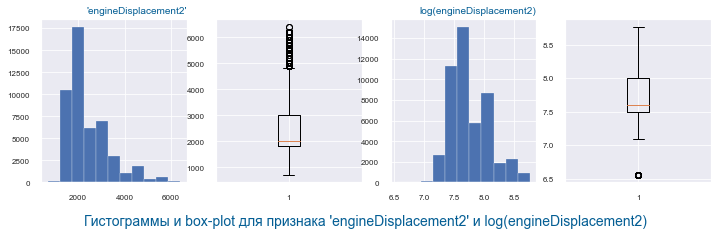

In [636]:
utils.four_plot_with_log2('engineDisplacement2', df[df['Train']==1])

In [637]:
# добавим новый признак логарифм
df['engineDisplacement2_log'] = np.log(df['engineDisplacement2'] + 1)
num_cols.append('engineDisplacement2_log')

***Резюме по engineDisplacement:-*** Создан новый числовой признак объем двигателя в см3. После обработки пропуски оказались по электромобилям. Заполнили пропуски средними значениями по похожим параметрам - ими оказались гибриды с объемом 700 см3. Также удалили выбросы по порогу мин-макс теста по БМВ. Распределение скорее логнормальное - создали новый признак engineDisplacement2_log. 

In [638]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('engineDisplacement')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 5, осталось 18
Кол-во строк в трейне:=  48694 . Убрали на данном шаге:=  11
Кол-во строк в тесте:=  3837


### 6.6 numberOfDoors

In [639]:
# переведем в int64 критерий numberOfDoors
df['numberOfDoors'] = df['numberOfDoors'].astype('int64')

In [640]:
df.groupby('numberOfDoors').mean().sort_values(by = 'price')

,enginePower,mileage,modelDate,productionDate,Train,id,price,engineDisplacement2,engineDisplacement2_log
numberOfDoors,,,,,,,,,
3,132.424293,162335.830283,2005.094842,2007.199667,0.940100,1666.472222,5.236487e+05,1719.966722,7.437796
4,177.335177,155412.017843,2007.538327,2009.654705,0.920554,1931.284818,1.091194e+06,2196.760367,7.652885
5,211.560235,116915.081458,2010.309855,2012.382368,0.935210,1911.730005,1.915941e+06,2575.351508,7.788568
2,278.581633,101774.086097,2006.887755,2008.915179,0.844388,1918.766393,2.815255e+06,2900.701531,7.910174


In [641]:
utils.describe_without_plots('numberOfDoors', df[df['Train']==1].numberOfDoors)

,numberOfDoors
кол-во строк,48694
тип значений,int64
кол-во значений,48694
кол-во NaN,0
среднее,4.51592
медиана,5
мин,2
макс,5


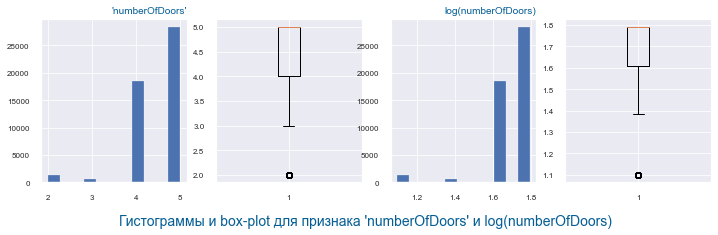

In [642]:
utils.four_plot_with_log2('numberOfDoors', df[df['Train']==1])

In [643]:
# фактически это категориальный признак с 4 значениями, но для корректной групповой обработки числовых признаков переведем его в числовые
cat_cols.remove('numberOfDoors')
num_cols.append('numberOfDoors')

In [644]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('numberOfDoors')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 6, осталось 17
Кол-во строк в трейне:=  48694 . Убрали на данном шаге:=  0
Кол-во строк в тесте:=  3837


### 6.7 mileage

In [645]:
# переведем в int64 критерий numberOfDoors
df['mileage'] = df['mileage'].astype('int64')

In [646]:
utils.describe_without_plots('mileage', df[df['Train']==1].mileage)

,mileage
кол-во строк,48694
тип значений,int64
кол-во значений,48694
кол-во NaN,0
среднее,132723
медиана,129000
мин,0
макс,1e+06


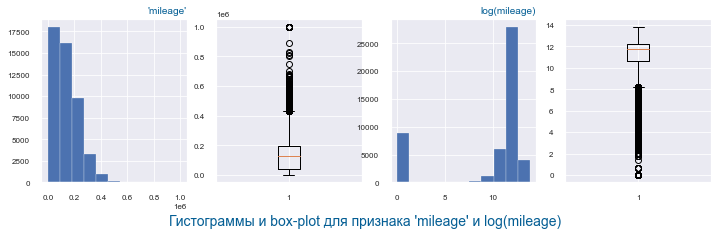

In [647]:
utils.four_plot_with_log2('mileage', df[df['Train']==1])

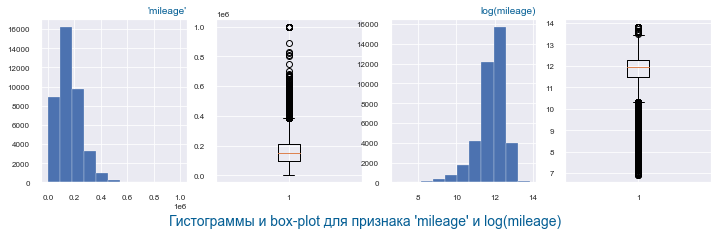

In [648]:
# посмотрим гистограммы на не новых автомобилях
utils.four_plot_with_log2('mileage', df[(df['Train']==1) & (df['mileage']>1000)])

In [649]:
# посмотрим где проходят границы выбросов 
utils.borders_of_outliers('mileage',df[df['Train']==1], log = False)

,левая,правая
границы выбросов,-194543.125,431925.875
кол-во значений за границей,0.000,451.000


In [650]:
# посмотрим какие это марки с такими пробегами более 432000
df[(df['Train']==1) & (df['mileage']>432000)].brand.value_counts()

MERCEDES      85
AUDI          73
BMW           73
VOLKSWAGEN    59
TOYOTA        42
NISSAN        26
VOLVO         23
FORD          17
MAZDA          9
SUBARU         8
HONDA          6
LAND_ROVER     6
LEXUS          5
RENAULT        5
SUZUKI         3
CADILLAC       2
JEEP           2
INFINITI       1
CHRYSLER       1
Name: brand, dtype: int64

In [651]:
# посмотрим статистику на тесте по пробегу
utils.describe_without_plots('mileage', df[df['Train']==0].mileage)

,mileage
кол-во строк,3837
тип значений,int64
кол-во значений,3837
кол-во NaN,0
среднее,118536
медиана,108000
мин,1
макс,1e+06


In [652]:
# сколько авто в тесте за границей
df[(df['Train']==0) & (df['mileage']>432000)].brand.value_counts()

BMW    21
Name: brand, dtype: int64

In [653]:
# это полпроцента от объема теста удаляем все пробеги выше 432000 в трейне
df = df[((df['Train']==1) & (df['mileage']<=432000)) | ((df['Train']==0))]

***Резюме по mileage (пробег) *** - признак числовой. Удалили 446 выбросов с пробегом выше 432000 км из трейна. Пропусков нет.

In [654]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('mileage')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 7, осталось 16
Кол-во строк в трейне:=  48248 . Убрали на данном шаге:=  446
Кол-во строк в тесте:=  3837


### 6.7 price

Посмотрим на стоимость выбранных нами авто из тренировочной выборки

In [655]:
df[df['Train']==1]['price'].isna().sum()

220

In [656]:
df[(df['Train']==1)&(df['price'].isna())]['brand'].value_counts()

MERCEDES      28
BMW           26
TOYOTA        22
NISSAN        21
VOLKSWAGEN    21
FORD          16
VOLVO         11
MAZDA         11
AUDI          10
RENAULT        8
LEXUS          8
LAND_ROVER     7
HONDA          5
SUZUKI         5
INFINITI       4
PORSCHE        4
CADILLAC       3
JEEP           3
JAGUAR         2
CHRYSLER       2
SUBARU         2
MINI           1
Name: brand, dtype: int64

Пропуски цены есть практически во всех моделях. Удаляем эти данные, т.к. их менее 1%, и даже если мы их будем заполнять ближними значениями, тратить смысл на подгонку целевых переменных нет

In [657]:
df = df[((df['Train']==1)&(df['price'].isna()==False)) | (df['Train']==0)]

**Резюме по price (стоимость)** - целевая переменная. Удалили 220 нечисловых значения из трейна. Пропусков нет.

In [658]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('price')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 8, осталось 15
Кол-во строк в трейне:=  48028 . Убрали на данном шаге:=  220
Кол-во строк в тесте:=  3837


### 6.8 modelDate

In [729]:
# статистика по значениям в трейне
temp_df = df[df['Train']==1]
temp_df['modelDate'].isna().sum()

0

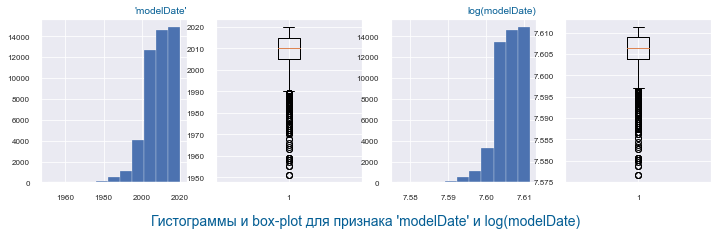

In [660]:
utils.four_plot_with_log2('modelDate', df[df['Train']==1])

In [661]:
# статистика по значениям в тесте
temp_df = df[df['Train']==0]
temp_df['modelDate'].value_counts()

2013.0    380
2011.0    373
2009.0    359
2010.0    308
2007.0    296
2015.0    285
2014.0    267
2012.0    215
2006.0    210
2008.0    191
2016.0    161
2018.0    125
2017.0    122
2005.0    116
2003.0     89
2002.0     54
2001.0     45
1995.0     44
1999.0     35
2000.0     33
1998.0     33
2019.0     26
1987.0     18
1990.0     13
2004.0     12
1982.0     11
1994.0      8
1981.0      3
1986.0      3
1975.0      1
1977.0      1
Name: modelDate, dtype: int64

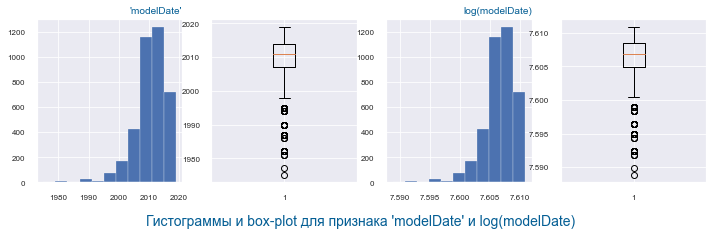

In [662]:
utils.four_plot_with_log2('modelDate', df[df['Train']==0])

Как мы видим, основная часть автомобилей, что в тестовой, что в тренировочной выборке начинается с начала-середины 90х. Так как у нас еще есть дата производства, скорее всего будем ориентироваться на нее.

Посмотрим, как влияет год модели на распределение стоимости автомобиля

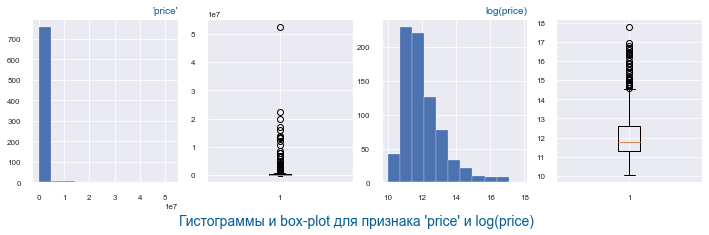

In [663]:
utils.four_plot_with_log2('price', df[(df['Train']==1)&(df['modelDate']<1990)])

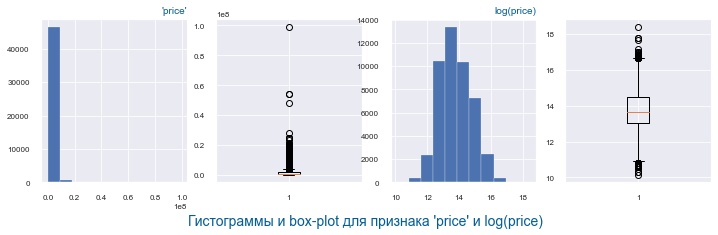

In [664]:
utils.four_plot_with_log2('price', df[(df['Train']==1)&(df['modelDate']>1990)])

In [665]:
df[(df['Train']==1)&(df['modelDate']<1990)].price.describe()

count    7.760000e+02
mean     6.289895e+05
std      2.670103e+06
min      2.300000e+04
25%      8.000000e+04
50%      1.300000e+05
75%      3.000000e+05
max      5.250000e+07
Name: price, dtype: float64

Посмотрим на авто, стоимость которых заметно выше (>75%) остальных:

In [666]:
df[(df['Train']==1)&(df['modelDate']<1990)&(df['price']>10000000)].describe()

,numberOfDoors,enginePower,mileage,modelDate,productionDate,Train,id,price,engineDisplacement2,engineDisplacement2_log
count,11.000000,11.000000,11.000000,11.000000,11.000000,11.0,0.0,1.100000e+01,11.000000,11.000000
mean,2.181818,128.636364,22018.545455,1956.727273,1959.818182,1.0,NaN,1.853589e+07,2436.363636,7.781784
std,0.603023,23.031599,24248.583828,6.182086,7.386720,0.0,NaN,1.178919e+07,467.488454,0.193159
min,2.000000,105.000000,1000.000000,1951.000000,1952.000000,1.0,NaN,1.080000e+07,1900.000000,7.550135
25%,2.000000,110.000000,3889.000000,1953.000000,1955.000000,1.0,NaN,1.300000e+07,2050.000000,7.623401
50%,2.000000,120.000000,10000.000000,1955.000000,1959.000000,1.0,NaN,1.400000e+07,2200.000000,7.696667
75%,2.000000,150.000000,42200.000000,1958.000000,1960.500000,1.0,NaN,1.840000e+07,2900.000000,7.972216
max,4.000000,165.000000,62300.000000,1973.000000,1976.000000,1.0,NaN,5.250000e+07,3000.000000,8.006701


***Резюме по modelDate** - числовой признак, но разброс стоимость авто старше 1990 года значительно отличается от остальной выборки, т.к. туда кроме старых ведер попадают действительно раритеты. Посмотрим на дату производства и скорее всего введем дополнительный признак "раритет", который будет указывать на то, что стоимость авто будет отличаться от остальных. Раритетные авто стоимостью более 10 млн рублей - кандидаты на удаление, т.к. это раритетные авто и все очень сильно будет зависеть от их состояния, которое у нас нигде не описано. Такие экземпляры всегда оцениваются штучно и предсказывать их стоимость нет смысла

In [667]:
df = df[((df['Train']==1)&(((df['price']<10000000)&(df['modelDate']<1990))|(df['modelDate']>=1990))) | (df['Train']==0)]

In [668]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('modelDate')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 9, осталось 14
Кол-во строк в трейне:=  48017 . Убрали на данном шаге:=  11
Кол-во строк в тесте:=  3837


### 6.9 productionDate

Статистика по значениям в трейне

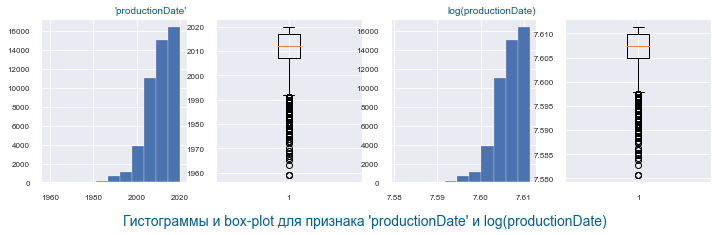

In [669]:
utils.four_plot_with_log2('productionDate', df[df['Train']==1])

В тестовой выборке

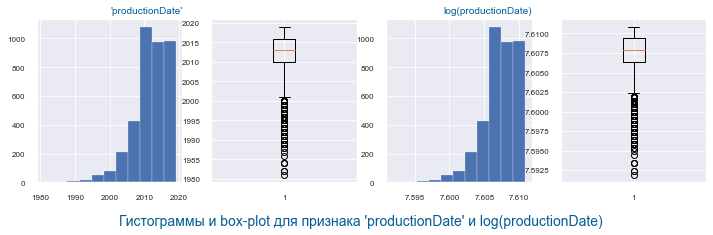

In [670]:
utils.four_plot_with_log2('productionDate', df[df['Train']==0])

Ожидаемо, распределение по году выпуска практически такое же, как и по году модели.

Посмотрим, как влияет год выпуска на распределение стоимости автомобиля

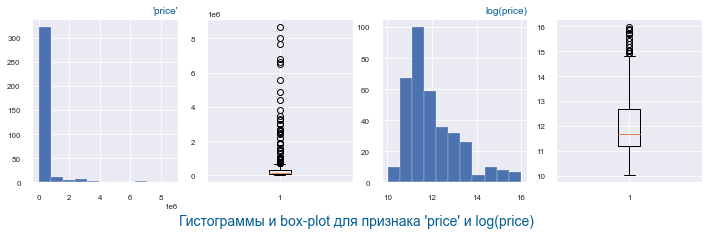

In [671]:
utils.four_plot_with_log2('price', df[(df['Train']==1)&(df['productionDate']<1990)])

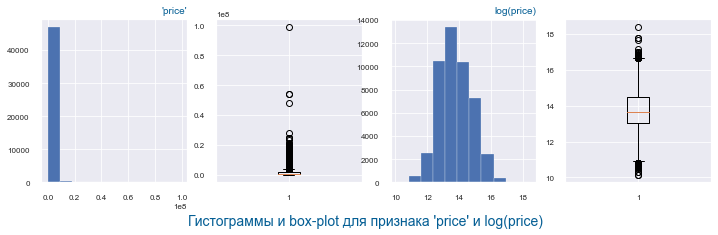

In [672]:
utils.four_plot_with_log2('price', df[(df['Train']==1)&(df['productionDate']>1990)])

In [673]:
df[(df['Train']==1)&(df['productionDate']<1990)].price.describe()

count    3.600000e+02
mean     4.844411e+05
std      1.156131e+06
min      2.300000e+04
25%      7.375000e+04
50%      1.200000e+05
75%      3.200000e+05
max      8.682520e+06
Name: price, dtype: float64

Посмотрим на авто, стоимость которых заметно выше остальных:

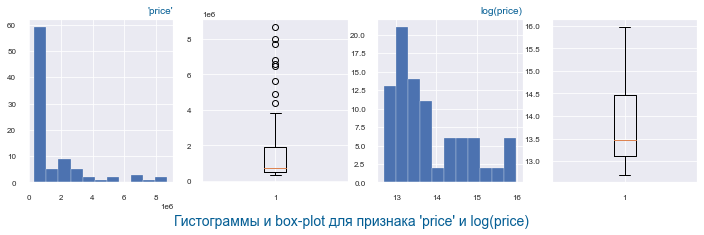

In [674]:
utils.four_plot_with_log2('price', df[(df['Train']==1)&(df['productionDate']<1990)&(df['price']>320000)])

Еще внимательнее

In [675]:
df[(df['Train']==1)&(df['productionDate']<1990)&(df['price']>1000000)].describe()

,numberOfDoors,enginePower,mileage,modelDate,productionDate,Train,id,price,engineDisplacement2,engineDisplacement2_log
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.0,0.0,3.000000e+01,30.000000,30.000000
mean,2.533333,200.966667,109597.566667,1971.200000,1976.166667,1.0,NaN,3.643748e+06,3710.000000,8.143320
std,0.899553,60.064037,82065.997311,9.621814,9.815833,0.0,NaN,2.187133e+06,1452.073428,0.401264
min,2.000000,120.000000,4500.000000,1957.000000,1959.000000,1.0,NaN,1.100000e+06,1300.000000,7.170888
25%,2.000000,157.000000,50000.000000,1963.000000,1967.250000,1.0,NaN,1.975000e+06,2800.000000,7.937732
50%,2.000000,194.500000,87544.500000,1971.000000,1978.000000,1.0,NaN,2.845000e+06,3200.000000,8.069263
75%,3.500000,237.750000,132500.000000,1979.000000,1985.000000,1.0,NaN,4.778034e+06,5100.000000,8.534752
max,4.000000,330.000000,339000.000000,1985.000000,1989.000000,1.0,NaN,8.682520e+06,6400.000000,8.764210


In [676]:
df[(df['Train']==1)&(df['productionDate']<1990)&(df['price']<1000000)].describe()

,numberOfDoors,enginePower,mileage,modelDate,productionDate,Train,id,price,engineDisplacement2,engineDisplacement2_log
count,328.000000,328.000000,328.000000,328.000000,328.000000,328.0,0.0,328.000000,328.000000,328.000000
mean,4.003049,123.396341,256870.524390,1983.439024,1986.393293,1.0,NaN,192336.402439,2263.719512,7.684340
std,0.593020,39.473309,100933.963016,4.079028,3.090018,0.0,NaN,200729.298448,763.739116,0.265117
min,2.000000,90.000000,7.000000,1968.000000,1969.000000,1.0,NaN,23000.000000,1400.000000,7.244942
25%,4.000000,90.000000,193750.000000,1982.000000,1985.000000,1.0,NaN,70000.000000,1800.000000,7.496097
50%,4.000000,113.000000,270000.000000,1984.000000,1987.500000,1.0,NaN,100000.000000,2000.000000,7.601402
75%,4.000000,136.000000,335949.000000,1986.000000,1989.000000,1.0,NaN,221250.000000,2300.000000,7.741099
max,5.000000,310.000000,422000.000000,1988.000000,1989.000000,1.0,NaN,999000.000000,5600.000000,8.630700


Пока непонятно как выделять раритеты, поэтому пока оставим эту идею.
Так как тестовый датасет не включает в себя новые авто (2020), удалим их из трейна. В боевых условиях трейн и тест будут собираться в одно время, поэтому в тесте будут актуальные значения, в нашем случае это не так.

In [677]:
df = df[((df['Train']==1)&(df['productionDate']<2020)) | (df['Train']==0)]

Добавим дополнительный признак 'intensity', который равен пробегу, поделенному на возраст авто, а также 'dateModelProdDiff', равный разнице между годом выпуска авто и годом начала производства модели

In [678]:
current_year = 2019
df['intensity']=df['mileage']/(current_year-df['productionDate'])
df['dateModelProdDiff']=df['productionDate']-df['modelDate']

***Резюме по productionDate** - числовой признак, дополнительно добавили два признака 'intensity' и 'dateModelProdDiff'

In [679]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('productionDate')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 10, осталось 13
Кол-во строк в трейне:=  39609 . Убрали на данном шаге:=  8408
Кол-во строк в тесте:=  3837


### 6.10 vehicleConfiguration

In [731]:
temp_df = df[df['Train']==1]
temp_df['vehicleConfiguration'].value_counts(normalize=True)

KeyError: 'vehicleConfiguration'

In [681]:
# статистика по значениям в тесте
temp_df = df[df['Train']==0]
temp_df['vehicleConfiguration']

89378              SEDAN AUTOMATIC 2.0
89379              SEDAN AUTOMATIC 2.0
89380              SEDAN AUTOMATIC 4.4
89381    ALLROAD_5_DOORS AUTOMATIC 3.0
89382    ALLROAD_5_DOORS AUTOMATIC 3.0
                     ...              
93210              SEDAN AUTOMATIC 2.0
93211    ALLROAD_5_DOORS AUTOMATIC 3.0
93212              SEDAN AUTOMATIC 2.5
93213              SEDAN AUTOMATIC 2.0
93214    ALLROAD_5_DOORS AUTOMATIC 4.4
Name: vehicleConfiguration, Length: 3837, dtype: object

***Резюме по vehicleConfiguration** - в нем есть все, что есть в других колонках, можно удалять

In [682]:
df=df.drop('vehicleConfiguration',axis=1)

In [683]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('vehicleConfiguration')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 11, осталось 12
Кол-во строк в трейне:=  39609 . Убрали на данном шаге:=  0
Кол-во строк в тесте:=  3837


### 6.11 vehicleTransmission

In [732]:
# статистика по значениям в трейне
temp_df = df[df['Train']==1]
temp_df['vehicleTransmission'].value_counts()

AUTOMATIC     23965
MECHANICAL     8451
ROBOT          3618
VARIATOR       3575
Name: vehicleTransmission, dtype: int64

In [685]:
# статистика по значениям в тесте
temp_df = df[df['Train']==0]
temp_df['vehicleTransmission'].value_counts()

автоматическая      3677
механическая         111
роботизированная      49
Name: vehicleTransmission, dtype: int64

Приведем значения параметра к одним названиям:

In [687]:
def transmission_conv(item):
    if item=='автоматическая':
        return 'AUTOMATIC'
    elif item=='механическая':
        return 'MECHANICAL'
    elif item=='роботизированная':
        return 'ROBOT'
    else:
        return item
    
df['vehicleTransmission']=df['vehicleTransmission'].apply(transmission_conv)

df['vehicleTransmission'].value_counts()

AUTOMATIC     27642
MECHANICAL     8562
ROBOT          3667
VARIATOR       3575
Name: vehicleTransmission, dtype: int64

***Резюме по vehicleTransmission** - категориальный признак, 4 значения

In [688]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('vehicleTransmission')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 12, осталось 11
Кол-во строк в трейне:=  39609 . Убрали на данном шаге:=  0
Кол-во строк в тесте:=  3837


### 6.12  Комплектация

In [692]:
temp_df = df[df['Train']==1]
temp_df['Комплектация']

0        {'id': '0'}
1        {'id': '0'}
2        {'id': '0'}
3        {'id': '0'}
4        {'id': '0'}
            ...     
88645    {'id': '0'}
88646    {'id': '0'}
88647    {'id': '0'}
88648    {'id': '0'}
88657    {'id': '0'}
Name: Комплектация, Length: 39609, dtype: object

In [694]:
# статистика по значениям в тесте
temp_df = df[df['Train']==0]
temp_df['Комплектация']

89378    ['[{"name":"Безопасность","values":["Антипробу...
89379    ['[{"name":"Комфорт","values":["Круиз-контроль...
89380    ['[{"name":"Комфорт","values":["Круиз-контроль...
89381    ['[{"name":"Комфорт","values":["Круиз-контроль...
89382    ['[{"name":"Комфорт","values":["Круиз-контроль...
                               ...                        
93210    ['[{"name":"Комфорт","values":["Круиз-контроль...
93211    ['[{"name":"Комфорт","values":["Круиз-контроль...
93212    ['[{"name":"Комфорт","values":["Круиз-контроль...
93213    ['[{"name":"Комфорт","values":["Круиз-контроль...
93214    ['[{"name":"Комфорт","values":["Круиз-контроль...
Name: Комплектация, Length: 3837, dtype: object

### 6.13  description

In [696]:
temp_df = df[df['Train']==1]
temp_df['description']

0         Машина  в приличном состоянии ,не гнилая не р...
1        Машина в оригинале не гнилая все вопросы по те...
2        ПТС Оригинал!\nПолный комплект ключей!\nПо рез...
3                                                      NaN
4        Машина не гнилая, дыр нет, днище целое, даже в...
                               ...                        
88645    Итак, сразу отсеим настоящих поклонников модел...
88646             На ходу,требуется покраска крыла и двери
88647                 Не гнилой,недавно обновили краску.\n
88648    АКПП устала , скидывает на вторую скорость.\nР...
88657    Легендарный Mercedes Benz 300 w189 лимузин. В ...
Name: description, Length: 39609, dtype: object

In [695]:
# статистика по значениям в тесте
temp_df = df[df['Train']==0]
temp_df['description']

89378    В РОЛЬФ Ясенево представлено более 500 автомоб...
89379    Автомобиль из демонстрационного парка по спец ...
89380                    Машина собиралась под заказ! \n\n
89381    АВТОМОБИЛЬ В БЕЗУПРЕЧНОМ ВНЕШНЕМ И ТЕХНИЧЕСКОМ...
89382    Автомобиль не имеет собственников ( физ. лиц) ...
                               ...                        
93210    Продаётся BMW 5 F10 Рестайлинг\n2 бережливых в...
93211    ✪  ✪  ✪  ✪  ✪  ✪  ✪  ✪  ✪ ✪  ✪  ✪  ✪  ✪  ✪  ✪ ...
93212    Продам полностью обслуженный автомобиль , сдел...
93213    Продаю отличный авто. Полностью обслужен. Лучш...
93214    Максимальная комплектация. 22.09.2019 сделано ...
Name: description, Length: 3837, dtype: object

### 6.14  Привод

In [734]:
temp_df = df[df['Train']==1]
temp_df['Привод'].value_counts()

полный      18219
передний    16863
задний       4527
Name: Привод, dtype: int64

In [699]:
# статистика по значениям в тесте
temp_df = df[df['Train']==0]
temp_df['Привод'].value_counts()

полный      2444
задний      1378
передний      15
Name: Привод, dtype: int64

***Резюме по Привод** - категориальный признак, 3 значения

In [700]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('Привод')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 13, осталось 10
Кол-во строк в трейне:=  39609 . Убрали на данном шаге:=  0
Кол-во строк в тесте:=  3837


### 6.15  Руль

In [704]:
df['Руль'].value_counts()

Левый    43446
Name: Руль, dtype: int64

Все авто у нас с левым рулем, удаляем столбец

In [706]:
df=df.drop('Руль',axis=1)

***Резюме по Руль** - удаляем за ненадобностью

In [707]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('Руль')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 14, осталось 9
Кол-во строк в трейне:=  39609 . Убрали на данном шаге:=  0
Кол-во строк в тесте:=  3837


### 6.15  Состояние

In [708]:
temp_df = df[df['Train']==1]
temp_df['Состояние'].value_counts()

Series([], Name: Состояние, dtype: int64)

In [709]:
# статистика по значениям в тесте
temp_df = df[df['Train']==0]
temp_df['Состояние'].value_counts()

Не требует ремонта    3837
Name: Состояние, dtype: int64

***Резюме по Состояние** - все авто в исправном состоянии. Если встретим в трейне в описании авто не на ходу - удаляем.

In [710]:
df=df.drop('Состояние',axis=1)

In [711]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('Состояние')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 15, осталось 8
Кол-во строк в трейне:=  39609 . Убрали на данном шаге:=  0
Кол-во строк в тесте:=  3837


### 6.16 ПТС

In [736]:
temp_df = df[df['Train']==1]
temp_df['ПТС'].value_counts()

Оригинал    33951
Дубликат     5638
Name: ПТС, dtype: int64

In [737]:
temp_df['ПТС'].isna().sum()

20

In [738]:
temp_df[temp_df['ПТС'].isna()]

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,start_date,Train,id,price,engineDisplacement2,engineDisplacement2_log,intensity,dateModelProdDiff
2591,лифтбек,AUDI,голубой,бензин,55 TFSI 3.0 AMT (340 л.с.) 4WD,5,ROBOT,55,340,Автомобиль представлен ГК Авто Премиум.\nКрупн...,"{'id': '21321888', 'name': '55 TFSI quattro S ...",полный,NaN,NaN,NaN,A7,0,2018.0,2019.0,2020-07-21T16:10:16Z,1,NaN,5785000.0,3000.0,8.006701,NaN,1.0
3034,внедорожник 5 дв.,AUDI,серый,бензин,35 TFSI 1.4 AMT (150 л.с.),5,ROBOT,35,150,Ауди Центр Тверь\nОфициальный дилер Audi в Тве...,"{'id': '21668149', 'name': 'Sport 35 TFSI S tr...",передний,NaN,NaN,NaN,Q3,0,2018.0,2019.0,2020-05-18T07:12:16Z,1,NaN,3036000.0,1400.0,7.244942,NaN,1.0
3929,внедорожник 5 дв.,AUDI,белый,бензин,55 TFSI 3.0 AT (340 л.с.) 4WD,5,AUTOMATIC,55,340,Безупречные условия в Ауди Центре Алтуфьево!\n...,"{'id': '21425160', 'name': '55 TFSI', 'availab...",полный,NaN,NaN,NaN,Q8,0,2018.0,2019.0,2020-04-08T11:48:21Z,1,NaN,5904368.0,3000.0,8.006701,NaN,1.0
11543,внедорожник 5 дв.,CADILLAC,синий,бензин,6.2 AT (426 л.с.) 4WD,5,AUTOMATIC,6.2,426,Автоцентр Сити - официальный дилер Cadillac и ...,"{'id': '20490545', 'name': 'Luxury', 'availabl...",полный,NaN,NaN,NaN,ESCALADE,0,2014.0,2019.0,2020-09-07T10:19:38Z,1,NaN,6636000.0,6200.0,8.732466,NaN,5.0
11549,внедорожник 5 дв.,CADILLAC,чёрный,бензин,6.2 AT (426 л.с.) 4WD,5,AUTOMATIC,6.2,426,Автоцентр Сити - официальный дилер Cadillac и ...,"{'id': '20490545', 'name': 'Luxury', 'availabl...",полный,NaN,NaN,NaN,ESCALADE,0,2014.0,2019.0,2020-09-07T10:31:12Z,1,NaN,6736000.0,6200.0,8.732466,NaN,5.0
73385,седан,VOLKSWAGEN,серый,бензин,1.6 MT (110 л.с.),4,MECHANICAL,1.6,110,ТОЛЬКО У НАС ВЫ МОЖЕТЕ КУПИТЬ АВТОМОБИЛЬ НЕ ВЫ...,"{'id': '21495741', 'name': 'CONNECT', 'availab...",передний,NaN,NaN,NaN,POLO,0,2014.0,2019.0,2020-04-02T13:06:55Z,1,NaN,940300.0,1600.0,7.378384,NaN,5.0
73395,седан,VOLKSWAGEN,белый,бензин,1.6 MT (110 л.с.),4,MECHANICAL,1.6,110,ТОЛЬКО У НАС ВЫ МОЖЕТЕ КУПИТЬ АВТОМОБИЛЬ НЕ ВЫ...,"{'id': '21495741', 'name': 'CONNECT', 'availab...",передний,NaN,NaN,NaN,POLO,0,2014.0,2019.0,2020-04-02T13:03:09Z,1,NaN,871900.0,1600.0,7.378384,NaN,5.0
78142,внедорожник 5 дв.,VOLVO,чёрный,бензин,2.0 AT (249 л.с.) 4WD,5,AUTOMATIC,2.0,249,Только в феврале!\nМарафон Максимальных выгод ...,"{'id': '21554637', 'name': 'Momentum (MY20)', ...",полный,NaN,NaN,NaN,XC90,0,2019.0,2019.0,2020-09-01T12:16:40Z,1,NaN,4580671.0,2000.0,7.601402,NaN,0.0
83299,купе,MERCEDES,синий,бензин,200 2.0 AT (197 л.с.) 4WD,2,AUTOMATIC,200,197,Добро пожаловать в «МБ-Тверь»! Мы работаем для...,"{'id': '21228969', 'name': 'E 200 4MATIC Sport...",полный,NaN,NaN,NaN,E_KLASSE,0,2016.0,2019.0,2020-04-09T16:37:53Z,1,NaN,4050000.0,2000.0,7.601402,NaN,3.0
83301,седан,MERCEDES,чёрный,бензин,200 2.0 AT (197 л.с.),4,AUTOMATIC,200,197,Добро пожаловать в «МБ-Тверь»! Мы работаем для...,"{'id': '21464201', 'name': 'E 200 Premium', 'a...",задний,NaN,NaN,NaN,E_KLASSE,0,2016.0,2019.0,2020-08-02T12:54:39Z,1,NaN,2800000.0,2000.0,7.601402,NaN,3.0


Все авто продаются дилерами, т.е. ПТС будет оригинальным

In [713]:
# статистика по значениям в тесте
temp_df = df[df['Train']==0]
temp_df['ПТС'].value_counts()

Оригинал    3463
Дубликат     374
Name: ПТС, dtype: int64

In [739]:
df['ПТС'].fillna('Оригинал', inplace = True)

***Резюме по ПТС** - категориальный признак, 2 состояния

In [714]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('ПТС')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 16, осталось 7
Кол-во строк в трейне:=  39609 . Убрали на данном шаге:=  0
Кол-во строк в тесте:=  3837


### 6.17  Владение

In [722]:
temp_df = df[df['Train']==1]
temp_df['Владение'].value_counts()

{'year': 2019, 'month': 8}     271
{'year': 2018, 'month': 10}    266
{'year': 2018, 'month': 11}    254
{'year': 2019, 'month': 10}    250
{'year': 2019, 'month': 4}     245
                              ... 
{'year': 1999, 'month': 12}      1
{'year': 2001, 'month': 10}      1
{'year': 2002, 'month': 4}       1
{'year': 2001, 'month': 12}      1
{'year': 2002, 'month': 10}      1
Name: Владение, Length: 262, dtype: int64

In [740]:
# статистика по значениям в тесте
temp_df = df[df['Train']==0]
temp_df['Владение'].value_counts()

1 год и 1 месяц        40
1 год и 4 месяца       39
1 год и 3 месяца       37
1 год и 2 месяца       36
1 год и 8 месяцев      33
                       ..
15 лет и 10 месяцев     1
10 лет и 1 месяц        1
16 лет и 6 месяцев      1
9 лет и 7 месяцев       1
10 лет                  1
Name: Владение, Length: 157, dtype: int64

Преобразуем текст в месяцы

In [741]:
def vlad_conv(string):
   
    if type(string) is str:
        
        pattern = re.compile('\d+\s')
        numbers = pattern.findall(string)
        
        if len(numbers)==2:
            return float(numbers[0])*12 + float(numbers[1])
        
        else:
            pattern = re.compile('месяц+')
            
            if len(pattern.findall(string))>0:
                return float(numbers[0])
            else:
                return float(numbers[0])*12
    else:
                return 0


temp_df['Владение'] = temp_df['Владение'].apply(vlad_conv)
temp_df['Владение'].value_counts()

0.0      2084
13.0       40
16.0       39
15.0       37
14.0       36
         ... 
200.0       1
133.0       1
327.0       1
151.0       1
221.0       1
Name: Владение, Length: 158, dtype: int64

In [742]:
temp_df[temp_df['Владение']==0]['description']

89378    В РОЛЬФ Ясенево представлено более 500 автомоб...
89379    Автомобиль из демонстрационного парка по спец ...
89381    АВТОМОБИЛЬ В БЕЗУПРЕЧНОМ ВНЕШНЕМ И ТЕХНИЧЕСКОМ...
89382    Автомобиль не имеет собственников ( физ. лиц) ...
89383    Авто в идеальном состоянии, все ТО по регламен...
                               ...                        
93206    Оригинал ПТС, По факту один владелец, сейчас а...
93207    ✪  ✪  ✪  ✪  ✪  ✪  ✪  ✪  ✪ ✪  ✪  ✪  ✪  ✪  ✪  ✪ ...
93208    РОЛЬФ Северо-Запад - это первый мегамолл автом...
93210    Продаётся BMW 5 F10 Рестайлинг\n2 бережливых в...
93211    ✪  ✪  ✪  ✪  ✪  ✪  ✪  ✪  ✪ ✪  ✪  ✪  ✪  ✪  ✪  ✪ ...
Name: description, Length: 2084, dtype: object

***Резюме по Владение** - все авто в исправном состоянии. Если встретим в трейне в описании авто не на ходу - удаляем.

In [710]:
df=df.drop('Состояние',axis=1)

In [711]:
# записываем признак в список проанализированных признаков
EDA_done_cols.append('Состояние')
print(f'Обработано признаков:= {len(EDA_done_cols)}, осталось {23-len(EDA_done_cols)}')
# смотрим как ведет себя трейн
temp = len(df[df['Train']==1])
print('Кол-во строк в трейне:= ', temp, '. Убрали на данном шаге:= ', old_len_train-temp)
old_len_train = temp
# проверяем что мы случайно не испортили тест
print('Кол-во строк в тесте:= ', len(df[df['Train']==0]))

Обработано признаков:= 15, осталось 8
Кол-во строк в трейне:=  39609 . Убрали на данном шаге:=  0
Кол-во строк в тесте:=  3837


# далее я еще не успел сделать EDA по всем признакам с выводами, а обработал признаки для моделирования и сабмита на кагл

In [743]:
utils.describe_without_plots_all_collumns(df, short=True)

,имя признака,тип,# значений,# пропусков(NaN),# уникальных,минимум,среднее,макс,медиана
0,bodyType,object,43446,0,11,NaN,NaN,NaN,NaN
1,brand,object,43446,0,22,NaN,NaN,NaN,NaN
2,color,object,43446,0,16,NaN,NaN,NaN,NaN
3,fuelType,object,43446,0,4,NaN,NaN,NaN,NaN
4,name,object,43446,0,2591,NaN,NaN,NaN,NaN
5,numberOfDoors,int64,43446,0,4,2,4.46552,5,5
6,vehicleTransmission,object,43446,0,4,NaN,NaN,NaN,NaN
7,engineDisplacement,object,43446,0,357,NaN,NaN,NaN,NaN
8,enginePower,int64,43446,0,302,90,199.009,625,177
9,description,object,41883,1563,39918,NaN,NaN,NaN,NaN


In [111]:
print(*cat_cols)

bodyType brand color fuelType name vehicleConfiguration vehicleTransmission description Комплектация Привод Состояние ПТС Владение model


In [112]:
# глобальное удаление необработанных признаков
# удалим vehicleConfiguration так как это композиция других критериев в строчном виде
cat_cols.remove('vehicleConfiguration')

# удалим Состояние потому что не понятно как его обработать
cat_cols.remove('Состояние')

# удалим model потому что не понятно как его обработать
cat_cols.remove('model')

# удалим Комплектация потому что не понятно как его обработать
cat_cols.remove('Комплектация')

# удалим start_date потому что не понятно как его обработать
time_cols.remove('start_date')

In [113]:
# заполним пропуски средними значениями без анализа
df['price'].fillna(df['price'].mean(), inplace = True)

# сделаем доппризнак лог
df['price_log']=df['price'].apply(lambda x: np.log(x))

# добавим в список целевых
target_col.append('price_log')

# удалим убычный прайс
target_col.remove('price')

In [114]:
# заполним пропуски самым частым Оригинал' без анализа
df['ПТС'].fillna('Нет', inplace = True)

In [115]:
# приведем числовые критерии к int64
for col in num_cols:
    df[col] = df[col].astype('int64')

In [116]:
# добавим что-то напоминающее модель в категориальные признаки 
df['model2'] = df['name'].apply(lambda x: str(x).split()[0])
cat_cols.append('model2')
# а name удалим
cat_cols.remove('name')

In [117]:
all_cols_df2 =cat_cols+num_cols+time_cols+servis_cols+bin_cols+target_col

In [118]:
df2 = df.loc[:, all_cols_df2].copy()
utils.describe_without_plots_all_collumns(df2, short=True)

,имя признака,тип,# значений,# пропусков(NaN),# уникальных,минимум,среднее,макс,медиана
0,bodyType,object,52085,0,11,NaN,NaN,NaN,NaN
1,brand,object,52085,0,22,NaN,NaN,NaN,NaN
2,color,object,52085,0,16,NaN,NaN,NaN,NaN
3,fuelType,object,52085,0,4,NaN,NaN,NaN,NaN
4,vehicleTransmission,object,52085,0,7,NaN,NaN,NaN,NaN
5,description,object,50501,1584,46379,NaN,NaN,NaN,NaN
6,Привод,object,52085,0,3,NaN,NaN,NaN,NaN
7,ПТС,object,52085,0,3,NaN,NaN,NaN,NaN
8,Владение,object,17000,35085,419,NaN,NaN,NaN,NaN
9,model2,object,52085,0,359,NaN,NaN,NaN,NaN


In [119]:
# обработка description
df2['description'] = df2['description'].fillna('[]')
df2['words_in_description'] = df2['description'].apply(lambda x: [str(i).lower() for i in x.split()])

In [120]:
df2['count_words_d'] = df2['description'].apply(lambda x: len(x.split()))
vectorizer = CountVectorizer()
text_feat = vectorizer.fit_transform(df2['description'])
df2['mean_c_w'] = text_feat.mean(axis=1)
df2['sum_c_w'] = text_feat.sum(axis=1)
# удаляем 'description'
cat_cols.remove('description')
# добавляем 'count_words_d', 'mean_c_w', 'sum_c_w'
num_cols.append('count_words_d')
num_cols.append('mean_c_w')
num_cols.append('sum_c_w')

In [121]:
print(*df2['words_in_description'][:3], sep='===')

['машина', 'в', 'приличном', 'состоянии', ',не', 'гнилая', 'не', 'ржавая', '.по', 'менины', 'этим', 'летом', 'коренные', 'и', 'шатунные', 'вкладыши', '.масло', 'не', 'ест', '.', 'цвет', 'черный', '.год', 'выпуска', '1991.двигатель', '2.8.привод', 'полный', 'кватро.все', 'стеклоподъемники', '.кожаный', 'салон', '.']===['машина', 'в', 'оригинале', 'не', 'гнилая', 'все', 'вопросы', 'по', 'телефону.', 'птс', 'оригинал,', 'двигатель', '1.8', '90', 'л/с,', 'карбюратор', 'родной', 'двигатель', 'масло', 'не', 'ест.']===['птс', 'оригинал!', 'полный', 'комплект', 'ключей!', 'по', 'результатам', 'комплексной', 'диагностики', 'автомобиля', 'серьезных', 'замечаний', 'не', 'выявлено.', 'комплектация:', '•', 'антиблокировочная', 'система', '•', 'антипробуксовочная', 'система', '•', 'система', 'курсовой', 'устойчивости', '•', 'блокировка', 'замков', 'задних', 'дверей', '•', 'сигнализация', '•', 'иммобилайзер', '•', 'центральный', 'замок', '•', 'усилитель', 'руля', '•', 'активный', 'усилитель', 'руля',

In [122]:
# обработка слов в description
# выделяем словосочетания которые могут влиять на цену авто (дополнительный тюнинг или допопции при покупке нового авто) 
# защита картера  - crankcase protection
df2['c_p_des1']= df2['words_in_description'].apply(lambda x: 1 if ('защита' and 'картера') in x else 0)
bin_cols.append('c_p_des1')

# мультифункциональный руль - multifunction steering wheel
df2['m_s_w_des2']= df2['words_in_description'].apply(lambda x: 1 if ('мультифункциональный' and 'руль') in x else 0)
bin_cols.append('m_s_w_des2')

# датчики дождя и света - rain and light sensors
df2['r_l_s_des3']= df2['words_in_description'].apply(lambda x: 1 if ('датчики' and 'дождя' and 'света') in x else 0)
bin_cols.append('r_l_s_des3')

# АБС
df2['abs_des4']= df2['words_in_description'].apply(lambda x: 1 if ('антиблокировочная' and 'система') in x else 0)
bin_cols.append('abs_des4')

# круиз контроль - cruise control
df2['c_c_des5']= df2['words_in_description'].apply(lambda x: 1 if ('круиз-контроль') in x else 0)
bin_cols.append('c_c_des5')

# легкосплавные диски - alloy wheels
df2['a_w_des6']= df2['words_in_description'].apply(lambda x: 1 if ('легкосплавные' and 'диски') in x else 0)
bin_cols.append('a_w_des6')

# камера заднего вида - rear view camera
df2['r_v_c_des7']= df2['words_in_description'].apply(lambda x: 1 if ('камера' and 'видеокамера') in x else 0)
bin_cols.append('r_v_c_des7')

In [123]:
# обработка Владение
df2['Владение_is_NaN'] = pd.isna(df2['Владение']).astype('uint8')
bin_cols.append('Владение_is_NaN')

df2['Владение'] = df2['Владение'].fillna('nodata')
def months_to_sent(months):
    if months == 1:
        return f'{months} месяц'
    elif 2 <= months <= 4:
        return f'{months} месяца'
    return f'{months} месяцев'
def years_to_sent(years):
    if 11 <= years <= 14 or 5 <= years%10 <= 9 or years%10 == 0:
        return f'{years} лет'
    elif years%10 == 1:
        return f'{years} год'
    elif 2 <= years%10 <= 4:
        return f'{years} годa'
def tenure(row):
    row = re.findall('\d+',row)
    if row != []:
        years = 2020 - (int(row[0])+1)
        months = 2 +(12 - int(row[1]))
        if years < 0:
            return months_to_sent(int(row[1]))
        elif years == 0 and months < 12:
            return months_to_sent(months)
        elif years >= 0 and months == 12:
            return years_to_sent(years + 1)
        elif years >= 0 and months > 12:
            return years_to_sent(years + 1)+' и '+months_to_sent(months - 12)
        elif years > 0 and months < 12:
            return years_to_sent(years)+' и '+months_to_sent(months)
        return None
    
df2.loc[df2['Train']==1,'Владение'] = df2[df2['Train']==1]['Владение'].apply(tenure)

In [124]:
def num_of_months(row):
    if pd.notnull(row) and row!='nodata':
        list_ownership = row.split()
        if len(list_ownership) == 2:
            if list_ownership[1] in ['год', 'года', 'лет']:
                return int(list_ownership[0])*12
            return int(list_ownership[0])
        return int(list_ownership[0])*12 + int(list_ownership[3])

In [125]:
df2['num_of_month'] = df2['Владение'].apply(num_of_months)
# добавляем кол-во месяцев владения
num_cols.append('num_of_month')
# удаляем владение 
cat_cols.remove('Владение')

In [126]:
df2['num_of_month'].value_counts(bins=50, normalize=True)[:10]

(0.494, 11.1]    0.071403
(11.1, 21.2]     0.050878
(21.2, 31.3]     0.036901
(31.3, 41.4]     0.030661
(41.4, 51.5]     0.023212
(61.6, 71.7]     0.020563
(51.5, 61.6]     0.019526
(71.7, 81.8]     0.017414
(81.8, 91.9]     0.014035
(91.9, 102.0]    0.012038
Name: num_of_month, dtype: float64

In [127]:
df2['num_of_month'].describe()

count    17000.000000
mean        44.972118
std         41.109557
min          1.000000
25%         14.000000
50%         33.000000
75%         67.000000
max        506.000000
Name: num_of_month, dtype: float64

In [128]:
df2[df2['num_of_month']>0].describe()

,mileage,modelDate,productionDate,enginePower,engineDisplacement2,engineDisplacement2_log,numberOfDoors,Владельцы,Train,id,price_log,count_words_d,mean_c_w,sum_c_w,c_p_des1,m_s_w_des2,r_l_s_des3,abs_des4,c_c_des5,a_w_des6,r_v_c_des7,Владение_is_NaN,num_of_month
count,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,1753.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.0,17000.000000
mean,155988.967941,2007.463235,2009.496529,199.591118,2507.623529,7.319647,4.464824,2.238706,0.896882,1921.471192,13.587528,75.842588,0.000753,68.145294,0.007118,0.025059,0.016941,0.067235,0.011765,0.111529,0.002647,0.0,44.972118
std,87786.183984,6.341308,6.078568,86.869049,948.772959,0.467613,0.708746,0.814717,0.304121,1111.576272,0.831245,100.319290,0.000997,90.322769,0.084068,0.156308,0.129055,0.250436,0.107828,0.314796,0.051383,0.0,41.109557
min,1.000000,1951.000000,1952.000000,90.000000,700.000000,6.000000,2.000000,1.000000,0.000000,2.000000,10.308953,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000
25%,92000.000000,2005.000000,2007.000000,140.000000,1800.000000,7.000000,4.000000,2.000000,1.000000,963.000000,13.017003,24.000000,0.000243,22.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,14.000000
50%,149500.000000,2008.000000,2010.000000,181.000000,2000.000000,7.000000,5.000000,2.000000,1.000000,1931.000000,13.579788,49.000000,0.000497,45.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,33.000000
75%,207000.000000,2012.000000,2014.000000,245.000000,3000.000000,8.000000,5.000000,3.000000,1.000000,2895.000000,14.300251,94.000000,0.000928,84.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,67.000000
max,520416.000000,2020.000000,2020.000000,625.000000,6400.000000,8.000000,5.000000,3.000000,1.000000,3836.000000,17.776324,4545.000000,0.045321,4104.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,506.000000


In [129]:
# колво пропусков месяцев с нулевым пробегом
len(df2[df2['num_of_month'].isna() & (df2['mileage']==0)])

8959

In [130]:
df2[df2['num_of_month']<3].head(3)

,bodyType,brand,color,fuelType,vehicleTransmission,description,Привод,ПТС,Владение,model2,mileage,modelDate,productionDate,enginePower,engineDisplacement2,engineDisplacement2_log,numberOfDoors,Владельцы,Train,id,price_log,words_in_description,count_words_d,mean_c_w,sum_c_w,c_p_des1,m_s_w_des2,r_l_s_des3,abs_des4,c_c_des5,a_w_des6,r_v_c_des7,Владение_is_NaN,num_of_month
73,седан,AUDI,чёрный,бензин,MECHANICAL,"Вложено много сил , временни и денег , минусы ...",передний,Оригинал,1 месяц,2.3,225000,1990,1994,133,2300,7,4,3,1,NaN,11.849398,"[вложено, много, сил, ,, временни, и, денег, ,...",19,0.000155,14,0,0,0,0,0,0,0,0,1.0
197,седан,AUDI,зелёный,бензин,MECHANICAL,"Состояние нормальное, на ходу аккумулятор новы...",передний,Оригинал,1 месяц,2.0,389300,1991,1995,115,2000,7,4,3,1,NaN,11.643954,"[состояние, нормальное,, на, ходу, аккумулятор...",10,0.000110,10,0,0,0,0,0,0,0,0,1.0
426,седан,AUDI,белый,бензин,ROBOT,"Машина в идеальном техническом состоянии, ника...",передний,Оригинал,2 годa,1.4,85000,2012,2015,125,1400,7,4,2,1,NaN,13.815511,"[машина, в, идеальном, техническом, состоянии,...",21,0.000210,19,0,0,0,0,0,0,0,0,2.0


In [131]:
df2[df2['num_of_month']<12].mileage.describe()

count      3719.000000
mean     145952.622210
std       94663.377371
min           1.000000
25%       76000.000000
50%      141000.000000
75%      200000.000000
max      498000.000000
Name: mileage, dtype: float64

In [132]:
df2[df2['num_of_month']<18].mileage.describe()

count      5344.000000
mean     145180.214259
std       93545.664659
min           1.000000
25%       75000.000000
50%      140000.000000
75%      200000.000000
max      498000.000000
Name: mileage, dtype: float64

In [133]:
df2[df2['num_of_month']<22].mileage.describe()

count      6369.000000
mean     145442.305542
std       92148.000058
min           1.000000
25%       77000.000000
50%      140000.000000
75%      200000.000000
max      498000.000000
Name: mileage, dtype: float64

In [134]:
# надо удалить владение так как заполнен он слабо , заполниь его не представляется возможным
num_cols.remove('num_of_month')
bin_cols.remove('Владение_is_NaN')

In [135]:
df2['modelDate'] = 2020 - df2['modelDate']
df2['productionDate'] = 2020 - df2['productionDate']
df2['dif_b_prod_model'] = df2['productionDate'] - df2['modelDate']

num_cols.append('dif_b_prod_model')

In [136]:
all_cols_df3 =cat_cols+num_cols+time_cols+servis_cols+bin_cols+target_col

In [137]:
df3 = df2.loc[:, all_cols_df3].copy()
utils.describe_without_plots_all_collumns(df3, short=True)

,имя признака,тип,# значений,# пропусков(NaN),# уникальных,минимум,среднее,макс,медиана
0,bodyType,object,52085,0,11,NaN,NaN,NaN,NaN
1,brand,object,52085,0,22,NaN,NaN,NaN,NaN
2,color,object,52085,0,16,NaN,NaN,NaN,NaN
3,fuelType,object,52085,0,4,NaN,NaN,NaN,NaN
4,vehicleTransmission,object,52085,0,7,NaN,NaN,NaN,NaN
5,Привод,object,52085,0,3,NaN,NaN,NaN,NaN
6,ПТС,object,52085,0,3,NaN,NaN,NaN,NaN
7,model2,object,52085,0,359,NaN,NaN,NaN,NaN
8,mileage,int64,52085,0,11346,0,128432,1e+06,125000
9,modelDate,int64,52085,0,61,0,10.7864,69,10


In [138]:
df3[~df3['id'].isna()].isna().sum().sum()

0

пропусков нет

In [139]:
# # сохранение датасета и названий столбцов, чтобы потом его заново не генерить
# df3.to_csv(PATH_to_file+'df3.csv', index=False)

In [173]:
# # также сохраняем названия столбцов по типам
# df_cols = pd.DataFrame()
# df_cols['cat_cols']=[','.join(cat_cols)]
# df_cols['num_cols']=[','.join(num_cols)]
# df_cols['servis_cols']=[','.join(servis_cols)]
# df_cols['bin_cols']=[','.join(bin_cols)]
# df_cols['target_col']=[','.join(target_col)]
# df_cols.to_csv(PATH_to_file+'df3_cols.csv', index=False)

In [4]:
# это блок закомментирован и требуется для закачивания готового датасета

df3 = pd.read_csv(PATH_to_file+'df3.csv')
df_test = pd.read_csv(PATH_to_file+'test.csv')
df_submit = pd.read_csv(PATH_to_file+'sample_submission.csv')
df_base_subm = pd.read_csv(PATH_to_file+'base_sub.csv')
pd.set_option('display.max_columns', None)
print('Размерность тренировочного датасета: ', df3.shape)
display(df3.head(2))
print('Размерность тестового датасета: ', df_test.shape)
display(df_test.head(2))
print('Размерность датасета c примером сабмишена: ', df_submit.shape)
display(df_submit.head(2))
print('Ориентировочный сабмишен: ', df_base_subm.shape)
display(df_base_subm.head(2))

Размерность тренировочного датасета:  (52085, 30)


,bodyType,brand,color,fuelType,vehicleTransmission,Привод,ПТС,model2,mileage,modelDate,productionDate,enginePower,engineDisplacement2,engineDisplacement2_log,numberOfDoors,Владельцы,count_words_d,mean_c_w,sum_c_w,dif_b_prod_model,Train,id,c_p_des1,m_s_w_des2,r_l_s_des3,abs_des4,c_c_des5,a_w_des6,r_v_c_des7,price_log
0,седан,AUDI,чёрный,бензин,MECHANICAL,полный,Оригинал,2.8,350000,30,29,174,2800,7,4,3,32,0.000331,30,-1,1,NaN,0,0,0,0,0,0,0,12.206073
1,седан,AUDI,красный,бензин,MECHANICAL,передний,Оригинал,1.8,173424,38,34,90,1800,7,4,3,21,0.000199,18,-4,1,NaN,0,0,0,0,0,0,0,11.002100


Размерность тестового датасета:  (3837, 23)


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,mileage,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,id
0,седан,BMW,чёрный,дизель,2016.0,520d 2.0d AT (190 л.с.),4.0,2017.0,SEDAN AUTOMATIC 2.0,автоматическая,2.0 LTR,190 N12,В РОЛЬФ Ясенево представлено более 500 автомоб...,158836.0,"['[{""name"":""Безопасность"",""values"":[""Антипробу...",задний,Левый,Не требует ремонта,1 владелец,Оригинал,Растаможен,NaN,0
1,седан,BMW,белый,дизель,2018.0,318d 2.0d AT (150 л.с.),4.0,2019.0,SEDAN AUTOMATIC 2.0,автоматическая,2.0 LTR,150 N12,Автомобиль из демонстрационного парка по спец ...,10.0,"['[{""name"":""Комфорт"",""values"":[""Круиз-контроль...",задний,Левый,Не требует ремонта,1 владелец,Оригинал,Растаможен,NaN,1


Размерность датасета c примером сабмишена:  (3837, 2)


,id,price
0,0,5299000.0
1,1,1580000.0


Ориентировочный сабмишен:  (3837, 2)


,id,price
0,0,1620000.0
1,1,2530000.0


In [5]:
df3_cols= pd.read_csv(PATH_to_file+'df3_cols.csv')
cat_cols=df3_cols['cat_cols'][0].split(',')
num_cols = df3_cols['num_cols'][0].split(',')
servis_cols = df3_cols['servis_cols'][0].split(',')
bin_cols = df3_cols['bin_cols'][0].split(',')
target_col= df3_cols['target_col'][0].split(',')

In [6]:
# нехватает памяти чтобы провернуть стаккинг на всех марках , сделаем только на БМВ 
df3=df3[df3['brand']=='BMW']

In [7]:
print(*cat_cols)

NameError: name 'cat_cols' is not defined

In [8]:
# создаем дfмми переменные из категориальных переменных
df3 = pd.get_dummies(df3, columns = ['bodyType', 'brand', 'color', 'fuelType', 'vehicleTransmission', 'Привод', 'Владельцы', 'ПТС', 'model2', 'engineDisplacement2'])

In [9]:
train = df3.query('Train==1').drop(['Train','id'], axis = 1)
test = df3.query('Train==0').drop(['Train', 'price_log','id'], axis = 1)

In [10]:
X = train.drop(['price_log'], axis=1).reset_index(drop=True)
y = train['price_log'].values

In [60]:
k=1.18
models = [RandomForestRegressor(random_state = RANDOM_SEED, n_jobs = -1, verbose = 1),
         BaggingRegressor(ExtraTreeRegressor(random_state=RANDOM_SEED), random_state=RANDOM_SEED)]

def stacking_model_predict(d_models, d_X, d_y, d_test, d_df_submit):
    for model_ in tqdm(d_models):
        model_.fit(d_X, d_y)
        pred_subm = model_.predict(d_test)
        d_df_submit[str(model_)[:6]] = pred_subm
        d_df_submit[str(model_)[:6]] = d_df_submit[str(model_)[:6]].apply(lambda x: np.exp(x) )
        d_df_submit[str(model_)[:6]] = d_df_submit[str(model_)[:6]].apply(lambda x: round(x/(k*1000))*1000)
    d_df_submit['price'] = d_df_submit.iloc[:,2:].mean(axis=1)
    d_df_submit[['id', 'price']].to_csv(f'submission_25.csv', index=False)
    d_df_submit.head(10)
    return 

stacking_model_predict(models, X, y, test, df_submit)

0%|          | 0/2 [00:00<?, ?it/s][Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
100%|██████████| 2/2 [00:08<00:00,  4.40s/it]


In [61]:
df_submit

,id,price,Random,Baggin
0,0,1565000.0,1537000,1593000
1,1,2126000.0,2154000,2098000
2,2,1256000.0,1250000,1262000
3,3,2381500.0,2466000,2297000
4,4,4191000.0,4418000,3964000
...,...,...,...,...
3832,3832,1006000.0,1080000,932000
3833,3833,2441000.0,2399000,2483000
3834,3834,523500.0,524000,523000
3835,3835,878000.0,887000,869000


In [47]:
df_base_subm

,id,price
0,0,1620000.0
1,1,2530000.0
2,2,1320000.0
3,3,2430000.0
4,4,5000000.0
...,...,...
3832,3832,1210000.0
3833,3833,2410000.0
3834,3834,500000.0
3835,3835,1060000.0


In [49]:
df_base_subm2

,id,price
0,0,1.619545e+06
1,1,2.462617e+06
2,2,1.248636e+06
3,3,2.468636e+06
4,4,4.898636e+06
...,...,...
3832,3832,1.105909e+06
3833,3833,2.557273e+06
3834,3834,5.550000e+05
3835,3835,9.336364e+05


In [17]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [22]:
MAPE = mean_absolute_percentage_error

In [65]:
MAPE(df_base_subm['price'], df_submit['price'])

9.061983648337764

In [19]:
df_base_subm2 = pd.read_csv(PATH_to_file+'base_sub2.csv')

In [26]:
MAPE(df_base_subm['price'], df_base_subm2['price'])

7.252557686880655

### 5. Перекрестный анализ между переменными и целевой переменной price
---


### Оценка корреляций

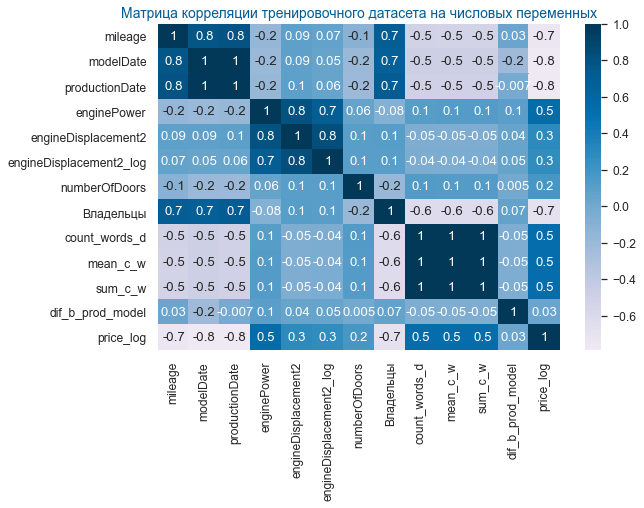

In [6]:
utils.simple_heatmap('Матрица корреляции тренировочного датасета на числовых переменных',df3[df3['Train']==1], num_cols+target_col, 1.1, 1, 9)

***Выводы по матрице корелляции по всем маркам***: - c таргетом выше всего скоррелированы (по убыванию) - modelDate (дата выхода модели), productionDate (дата производства), mileage (пробег). Владельцы (кол-во), enginePower(мощность авто л.с.), count_words_d, mean_c_w, sum_c_w (это данные из description кол-во слов всего, среднее и сумма не пересекающ.) и замыкает engineDisplacement2 (объем двигателя)

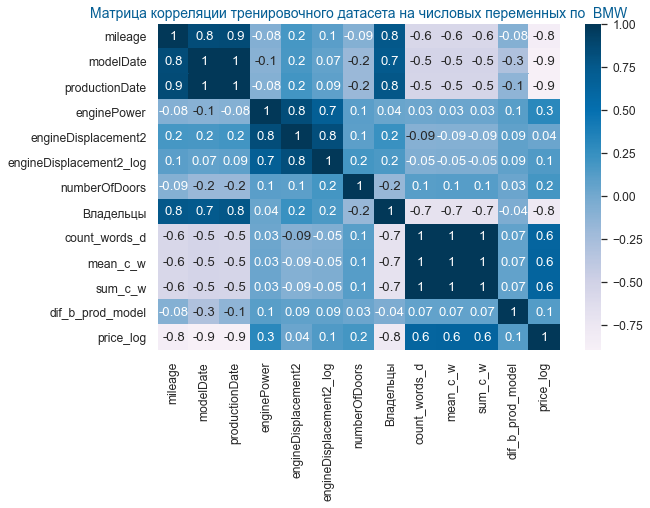

In [8]:
temp_df = df3[(df3['Train']==1) & (df3['brand']=='BMW')]
utils.simple_heatmap('Матрица корреляции тренировочного датасета на числовых переменных по  BMW',temp_df, num_cols+target_col, 1.1, 1, 9)

***Выводы по матрице корелляции ТОЛЬКО по BMW***: 
- c таргетом выше всего скоррелированы (по убыванию) - modelDate (дата выхода модели), productionDate (дата производства), mileage (пробег). Владельцы (кол-во), count_words_d, mean_c_w, sum_c_w (это данные из description кол-во слов всего, среднее и сумма не пересекающ.), enginePower(мощность авто л.с.), engineDisplacement2_log (логарифм от объема двигателя), dif_b_prod_model (разница между производством и выпуском модели) и замыкает engineDisplacement2 (объем двигателя)
- кореляция с таргетом enginePower(мощность авто л.с.) по BMW ниже чем по всем маркам
- кореляция с таргетом engineDisplacement2_log (логарифм от объема двигателя) выше в 25 раз, чем engineDisplacement2 (объем двигателя)

***Выводы из матрицы корреляции ОБЩИЕ***:
- между собой высокоскоррелированны признаки:
  - modelDate (дата выхода модели), productionDate (дата производства), mileage (пробег). Владельцы (кол-во)
  - count_words_d, mean_c_w, sum_c_w (это данные из description кол-во слов всего, среднее и сумма не пересекающ.)
  - enginePower(мощность авто л.с.), engineDisplacement2_log (логарифм от объема двигателя) и engineDisplacement2 (объем двигателя)  
  
На текущем этапе мы пока не будем делать выводов об исключении признаков, а просто примем ко вниманию эту информацию

### Значимость непрерывных переменных по ANOVA F test

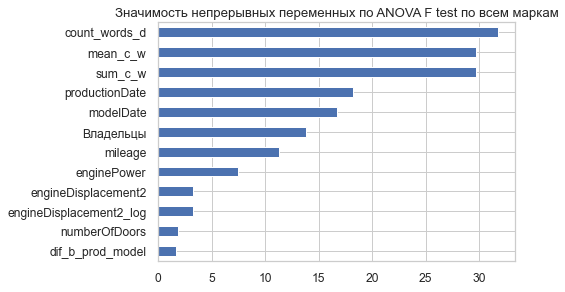

In [11]:
temp_df = df3[df3['Train']==1]
imp_num = pd.Series(f_classif(temp_df[num_cols], temp_df['price_log'])[0], index = num_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh', title='Значимость непрерывных переменных по ANOVA F test по всем маркам')

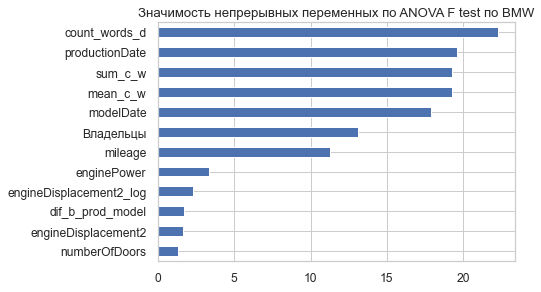

In [12]:
temp_df = df3[(df3['Train']==1) & (df3['brand']=='BMW')]
imp_num = pd.Series(f_classif(temp_df[num_cols], temp_df['price_log'])[0], index = num_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh', title='Значимость непрерывных переменных по ANOVA F test по BMW')

***Выводы:*** 
- значимость тройки признаков - count_words_d, mean_c_w, sum_c_w (это данные из description кол-во слов всего, среднее и сумма не пересекающ.) снижается на BMW и приходит к уровню productionDate (дата производства) и modelDate (дата выхода модели
- значимость engineDisplacement2 (объем двигателя) падает на авто БМВ

### Переведем категориальные признаки в dummies переменные

In [15]:
list_cols_bef_dumm = list(df3.columns)
# но сначала преобразуем категориальные переменные в дамми переменные
df3 = pd.get_dummies(df3, columns = ['bodyType', 'brand', 'color', 'fuelType', 'vehicleTransmission', 'Привод', 'Владельцы', 'ПТС', 'model2', 'engineDisplacement2'])
# обратите внимание, что мы признаки 'Владельцы' и 'engineDisplacement2' использовали как категориальные

# теперь создадим список дамми переменных
list_cols_aft_dumm = list(df3.columns)
dumm_cols= list(set(list_cols_aft_dumm)-set(list_cols_bef_dumm ))

In [20]:
print(f'Мы добавили:{len(dumm_cols)} dummie featuries')

Мы добавили:481 dummie featuries


In [21]:
# удалим 'Владельцы' и 'engineDisplacement2' из числовых признаков - они нам больше не понадобятся
num_cols.remove('engineDisplacement2')
num_cols.remove('Владельцы')

### Проверим статистическую значимость по всем не числовым признакам по тесту Стьюдента

In [69]:
# Проверим, есть ли статистическая разница в распределении оценок по всем категориальным признакам, 
# с помощью теста Стьюдента. Проверим нулевую гипотезу о том, 
# что распределения price_log по различным параметрам неразличимы:
def get_stat_dif(d_column, d_df):
    cols = d_df.loc[:, d_column].value_counts().index[:]
    combinations_all = list(combinations(cols, 2))
    for comb in combinations_all:
        ttest = ttest_ind(d_df.loc[d_df.loc[:, d_column] == comb[0], 'price_log'].dropna(),
                          d_df.loc[d_df.loc[:, d_column] == comb[1], 'price_log'].dropna()).pvalue
        if  ttest<= 0.05/len(combinations_all): # Учли поправку Бонферони
            return(d_column)
            break

In [70]:
stat_sign_diff_cols=[]

temp_df = df3[(df3['Train']==1)]
for col in bin_cols+dumm_cols:
    stat_sign_diff_cols.append(get_stat_dif(col,temp_df))
stat_sign_diff_cols = list(filter(None, stat_sign_diff_cols))

In [72]:
not_stat_sign_diff_cols=list(set(bin_cols+dumm_cols) - set(stat_sign_diff_cols))

{'bodyType_седан 2 дв.',
 'brand_JEEP',
 'brand_MINI',
 'color_серый',
 'engineDisplacement2_3400',
 'engineDisplacement2_3700',
 'engineDisplacement2_3900',
 'engineDisplacement2_4900',
 'engineDisplacement2_5300',
 'engineDisplacement2_5800',
 'engineDisplacement2_5900',
 'engineDisplacement2_6600',
 'model2_0.7hyb',
 'model2_1.5hyb',
 'model2_1.6d',
 'model2_1.8hyb',
 'model2_105',
 'model2_109',
 'model2_110',
 'model2_118d',
 'model2_118i',
 'model2_120d',
 'model2_125i',
 'model2_130i',
 'model2_135i',
 'model2_16V',
 'model2_18i',
 'model2_2.2d',
 'model2_2.3hyb',
 'model2_2.4hyb',
 'model2_2.5',
 'model2_2.5hyb',
 'model2_2.9d',
 'model2_2.9hyb',
 'model2_200h',
 'model2_218i',
 'model2_220d',
 'model2_220i',
 'model2_23d',
 'model2_23i',
 'model2_250C',
 'model2_250h',
 'model2_270',
 'model2_290',
 'model2_3.0',
 'model2_3.0hyb',
 'model2_3.0sd',
 'model2_3.0si',
 'model2_3.1d',
 'model2_3.3hyb',
 'model2_3.4d',
 'model2_3.5hyb',
 'model2_3.6d',
 'model2_3.7',
 'model2_3.9d',

{'a_w_des6',
 'abs_des4',
 'bodyType_внедорожник 5 дв.',
 'bodyType_кабриолет',
 'bodyType_компактвэн',
 'bodyType_купе',
 'bodyType_лифтбек',
 'bodyType_родстер',
 'bodyType_седан',
 'bodyType_седан 2 дв.',
 'bodyType_универсал 5 дв.',
 'bodyType_хэтчбек 3 дв.',
 'bodyType_хэтчбек 5 дв.',
 'brand_AUDI',
 'brand_BMW',
 'brand_CADILLAC',
 'brand_CHRYSLER',
 'brand_FORD',
 'brand_HONDA',
 'brand_INFINITI',
 'brand_JAGUAR',
 'brand_JEEP',
 'brand_LAND_ROVER',
 'brand_LEXUS',
 'brand_MAZDA',
 'brand_MERCEDES',
 'brand_MINI',
 'brand_NISSAN',
 'brand_PORSCHE',
 'brand_RENAULT',
 'brand_SUBARU',
 'brand_SUZUKI',
 'brand_TOYOTA',
 'brand_VOLKSWAGEN',
 'brand_VOLVO',
 'c_c_des5',
 'c_p_des1',
 'color_бежевый',
 'color_белый',
 'color_голубой',
 'color_жёлтый',
 'color_зелёный',
 'color_золотистый',
 'color_коричневый',
 'color_красный',
 'color_оранжевый',
 'color_пурпурный',
 'color_розовый',
 'color_серебристый',
 'color_серый',
 'color_синий',
 'color_фиолетовый',
 'color_чёрный',
 'engineD

### Значимость непрерывных переменных

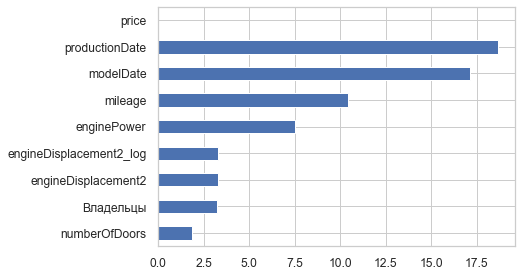

In [214]:
temp_df = df[df['Train']==1]
imp_num = pd.Series(f_classif(temp_df[num_cols], temp_df['price'])[0], index = num_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

## 6. Подготовка данных к машинному обучению
---
### Категориальные признаки


In [ ]:
# реализуем метод OneHotLabels через get_dummies
new_dumm_cat_cols = utils.get_dummies_df(df, cat_cols)
# мы специально не удаляем первоначальные столбы, чтобы потом можно было провести построчную проверку перед стандартизацией и моделированием

### Бинарные признаки

### Построчная верификация первых двух строк

In [217]:
display(df.head(2))

,mileage,modelDate,productionDate,price,enginePower,engineDisplacement2,engineDisplacement2_log,numberOfDoors,Владельцы,bodyType,brand,color,fuelType,name,vehicleConfiguration,vehicleTransmission,Привод,ПТС,Train,id
0,350000,1990,1991,200000,174,2800,7,4,3,седан,AUDI,чёрный,бензин,2.8 MT (174 л.с.) 4WD,SEDAN MECHANICAL 2.8,MECHANICAL,полный,Оригинал,1,NaN
1,173424,1982,1986,60000,90,1800,7,4,3,седан,AUDI,красный,бензин,1.8 MT (90 л.с.),SEDAN MECHANICAL 1.8,MECHANICAL,передний,Оригинал,1,NaN


### Стандартизация и заполнение пропусков

In [179]:
utils.StandardScaler_df_and_filna_0(df, num_cols)

### Удаление нечисловых критериев

In [180]:

df.drop(['education','app_date'], axis=1, inplace=True)

### Посмотрим на значимость категориальных и бинарных переменных 

In [221]:
temp_df = df[df['Train']==1]
imp_cat = pd.Series(mutual_info_classif(temp_df[cat_cols], temp_df['price'], discrete_features =True), index = cat_cols)
imp_cat.sort_values(inplace = True)
imp_cat.plot(kind = 'barh')

ValueError: could not convert string to float: 'седан'

## 7. Future engineering
---
### PolynomialFeatures

## 8. Построение модели
---
### Разбиваем датасет на тренировочный и тестовый

### Обучаем модель, генерируем результат и сравниваем с тестом

### Оценка качества модели
---
### Качественные метрики

In [62]:
y_test=df_submit['price']
y_pred = df_base_subm['price']

In [32]:
# в первый раз инициируем глобальную переменную с предыдущим скором
utils.last_pred = np.zeros((3,len(y_test)))

In [36]:
utils = reload(utils)

In [64]:
utils.test_last_pred(y_test, y_pred, y_pred) if (utils.last_pred[0].max() == 0) else 0
utils.all_metrics_MAE_MPE_MAPE_WAPE_MSE_RMSE(y_test, y_pred)

,Значение,Дельта с предыдущим,Описание
MAE,1.528861e+05,0.0,mean absolute error (средняя абсолютная ошибка)
MPE,-6.700684e+00,0.0,mean percentage error (средняя процентная ошибка)
MAPE,1.012652e+01,0.0,mean absolute percentage error (средняя абсолю...
SMAPE,9.440576e+00,0.0,symmetric MAPE (симетричная средняя абсолютная...
WMAPE,1.055542e+01,0.0,weighted absolute percent error (взвешенная аб...
MSE,1.044495e+11,0.0,mean squared error (среднеквадратичная ошибка)
RMSE,3.231865e+05,0.0,root mean squared error (корень из среднеквадр...
R2,9.168539e-01,0.0,coefficient of determination (коэффициент дете...


In [55]:
y_pred = df_submit['price']

In [46]:
utils.test_last_pred(y_test, y_pred, y_pred) if (utils.last_pred[0].max() == 0) else 0
utils.all_metrics_MAE_MPE_MAPE_WAPE_MSE_RMSE(y_test, y_pred)

,Значение,Дельта с предыдущим,Описание
MAE,1.241267e+06,-1.129921e+06,mean absolute error (средняя абсолютная ошибка)
MPE,-7.084181e+01,7.119774e+01,mean percentage error (средняя процентная ошибка)
MAPE,1.176541e+02,-1.104016e+02,mean absolute percentage error (средняя абсолю...
SMAPE,6.944602e+01,-6.220233e+01,symmetric MAPE (симетричная средняя абсолютная...
WMAPE,7.948966e+01,-7.235915e+01,weighted absolute percent error (взвешенная аб...
MSE,3.479846e+12,-3.429390e+12,mean squared error (среднеквадратичная ошибка)
RMSE,1.865434e+06,-1.640810e+06,root mean squared error (корень из среднеквадр...
R2,-1.099485e+00,2.069044e+00,coefficient of determination (коэффициент дете...


### Поиск оптимальных параметров модели

In [85]:
##Grid search
model = LogisticRegression(random_state=RANDOM_SEED)

# # первые параметры сетки поиска
# param_grid = [
#     {'penalty': ['l1'], 'solver': ['liblinear', 'saga'],'max_iter':[100],'tol':[1e-4]},
#     {'penalty': ['l2'], 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],'max_iter':[100],'tol':[1e-4]},
#     {'penalty': ['none'], 'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],'max_iter':[1000],'tol':[1e-4]},
# ]

param_grid = [
    {'penalty': ['l1'], 'solver': ['liblinear', 'saga'],'max_iter':[1000],'tol':[1e-5]},
    {'penalty': ['l2'], 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],'max_iter':[1000],'tol':[1e-5]},
    {'penalty': ['none'], 'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],'max_iter':[1000],'tol':[1e-5]},
]
gridsearch = GridSearchCV(model, param_grid, scoring='f1', n_jobs=-1, cv=5)
gridsearch.fit(X_train, y_train)
model = gridsearch.best_estimator_
##Print the best parameters
best_parameters = model.get_params()
for param_name in sorted(best_parameters.keys()):
        print('\t%s: %r' % (param_name, best_parameters[param_name]))
    ##Print the model scores
preds = model.predict(X_test)
print('Accuracy: %.4f' % accuracy_score(y_test, preds))
print('Precision: %.4f' % precision_score(y_test, preds))
print('Recall: %.4f' % recall_score(y_test, preds))
print('F1: %.4f' % f1_score(y_test, preds))

,Лучшие значения
Penalty,l2
C,1.9


### Отбор признаков

In [199]:
model = LogisticRegression(C=7, penalty='l2', multi_class = 'ovr', class_weight='balanced', solver='liblinear', random_state=RANDOM_SEED)

efs1 = EFS(model, 
           min_features=1,
           max_features=10,
           scoring='roc_auc',
           print_progress=True,
           cv=5)

efs1 = efs1.fit(X_train, y_train)

print('Best roc_auc score: %.2f' % efs1.best_score_)
print('Best subset (indices):', efs1.best_idx_)
print('Best subset (corresponding names):', efs1.best_feature_names_)

KeyboardInterrupt: 

### Кросс-валидация

In [195]:
model = LogisticRegression(C=7, penalty='l2', multi_class = 'ovr', class_weight='balanced', solver='liblinear') 
model.fit(X_train, y_train)

cross_val_score(model, X_test, y_test, cv=10, scoring='roc_auc')

array([0.70712468, 0.7086355 , 0.73762723, 0.70977903, 0.76377662,
       0.75701085, 0.69885094, 0.67932503, 0.71519486, 0.73579256])

## Submission

In [196]:
train_data = df_with_poly.query('Train != 3').drop(['Train']+first_drop_list_columns, axis=1)
test_data = df_with_poly.query('Train == 3').drop(['Train']+first_drop_list_columns, axis=1)

In [197]:
X_train=train_data.drop(['default_x'], axis=1)
y_train = train_data.default_x.values
X_test = test_data.drop(['default_x'], axis=1)

In [198]:
# проверяем
test_data.shape, train_data.shape, X_train.shape, y_train.shape, X_test.shape

((36349, 53), (73799, 53), (73799, 52), (73799,), (36349, 52))

In [199]:
model = LogisticRegression(C=7, penalty='l2', multi_class = 'ovr', class_weight='balanced', solver='liblinear', random_state=RANDOM_SEED)

model.fit(X_train, y_train)

LogisticRegression(C=7, class_weight='balanced', dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='ovr', n_jobs=None, penalty='l2',
                   random_state=42, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [200]:
y_pred_prob = model.predict_proba(X_test)[:,1]


submit = pd.DataFrame(df_test.client_id)
submit['default']=y_pred_prob
submit.to_csv('submission.csv', index=False)